# Phase 2-Exploatory Data Analysis

State/UT wise analysis.

Note : You need to be careful as this phase is whole state/ut wise analysis (not district-wise).

It is up to you which columns you want to keep or delete to make proper analysis"

2.1 Analysis of Literacy Rate vs Total Crimes.

2.2 Analysis of the type of crime vs each state vs Literacy rat

2.3 Analysis of year-on-year total crime rate.

2.4 Analysis of area vs overall crime

2.5 Analysis of Population vs overall Crime

2.6 Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.

In [1]:
#imporrting required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import plotly
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import init_notebook_mode

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('/home/yashika/finaldata.csv')

In [3]:
df.head()

,State/UT,Year,population(total),Rural,Urban,Tot_M,Tot_F,P_LIT,M_LIT,F_LIT,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children,Crime Rate
0,A& N ISLANDS,2001,356152,239954,116198,192972,163180,253135.0,146831.0,106304,...,0,0,323,658,1386,0,34.0,1.0,0.0,184.752578
1,ANDHRA PRADESH,2001,76210007,55401067,20808940,38527413,37682594,39934323.0,23444788.0,16489535,...,7,7400,34344,130089,278982,2933,13669.0,512.0,270.0,170.698055
2,ARUNACHAL PRADESH,2001,1097968,870087,227881,579941,518027,484785.0,303281.0,181504,...,0,0,618,2342,5243,0,180.0,72.0,0.0,213.303120
3,ASSAM,2001,26655528,23216288,3439240,13777037,12878491,14015354.0,8188697.0,5826657,...,0,2010,9315,36877,81418,6,4048.0,0.0,18.0,138.346537
4,BIHAR,2001,82998509,74316709,8681800,43243795,39754714,31109577.0,20644376.0,10465201,...,83,2406,36667,88432,189612,1303,4489.0,83.0,83.0,106.546492


In [5]:
print("There are {} Rows and {} Columns in our dataset".format(df.shape[0], df.shape[1]))

There are 420 Rows and 48 Columns in our dataset


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 48 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   State/UT                                             420 non-null    object 
 1   Year                                                 420 non-null    int64  
 2   population(total)                                    420 non-null    int64  
 3   Rural                                                420 non-null    int64  
 4   Urban                                                420 non-null    int64  
 5   Tot_M                                                420 non-null    int64  
 6   Tot_F                                                420 non-null    int64  
 7   P_LIT                                                420 non-null    float64
 8   M_LIT                                                420 non-null    f

Display the each column datatype and memory occupied. Also information about the Nulls as well

In [7]:
## Columns of the dataset
df.columns

Index(['State/UT', 'Year', 'population(total)', 'Rural', 'Urban', 'Tot_M',
       'Tot_F', 'P_LIT', 'M_LIT', 'F_LIT', 'Lit_rate', 'Area (km2)', 'MURDER',
       'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
       'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total Crimes', 'tot_crimes_sc', 'total crime against women',
       'Total c

In [8]:
(df['State/UT'].unique())

array(['A& N ISLANDS', 'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM',
       'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'GOA', 'GUJARAT', 'HARYANA',
       'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA',
       'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA',
       'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU',
       'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL'],
      dtype=object)

In [9]:
len(df['State/UT'].unique())

35

The data has total 35 states and union territories(from 2001 to 2012), but there are 36 as of 2023 (Telangana state is missing in the dataset)

In [10]:
df.head()

,State/UT,Year,population(total),Rural,Urban,Tot_M,Tot_F,P_LIT,M_LIT,F_LIT,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children,Crime Rate
0,A& N ISLANDS,2001,356152,239954,116198,192972,163180,253135.0,146831.0,106304,...,0,0,323,658,1386,0,34.0,1.0,0.0,184.752578
1,ANDHRA PRADESH,2001,76210007,55401067,20808940,38527413,37682594,39934323.0,23444788.0,16489535,...,7,7400,34344,130089,278982,2933,13669.0,512.0,270.0,170.698055
2,ARUNACHAL PRADESH,2001,1097968,870087,227881,579941,518027,484785.0,303281.0,181504,...,0,0,618,2342,5243,0,180.0,72.0,0.0,213.303120
3,ASSAM,2001,26655528,23216288,3439240,13777037,12878491,14015354.0,8188697.0,5826657,...,0,2010,9315,36877,81418,6,4048.0,0.0,18.0,138.346537
4,BIHAR,2001,82998509,74316709,8681800,43243795,39754714,31109577.0,20644376.0,10465201,...,83,2406,36667,88432,189612,1303,4489.0,83.0,83.0,106.546492


In [11]:
df.isnull().sum()

State/UT                                                0
Year                                                    0
population(total)                                       0
Rural                                                   0
Urban                                                   0
Tot_M                                                   0
Tot_F                                                   0
P_LIT                                                   0
M_LIT                                                   0
F_LIT                                                   0
Lit_rate                                                0
Area (km2)                                              0
MURDER                                                  0
ATTEMPT TO MURDER                                       0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER               0
RAPE                                                    0
CUSTODIAL RAPE                                          0
OTHER RAPE    

Null values is present in --> total crime against women,Total crimes against STs,Total crime against children

#### Filling Null Values using mean methods

In [12]:
df['Total crimes against STs'].describe()

count     387.000000
mean      185.077519
std       393.275773
min         0.000000
25%         0.000000
50%         6.000000
75%       209.500000
max      2894.000000
Name: Total crimes against STs, dtype: float64

In [13]:
df['Total crimes against STs']=df['Total crimes against STs'].fillna(df['Total crimes against STs'].mean())

In [14]:
df['Total crime against children'].describe()

count     418.000000
mean      587.267943
std      1036.458881
min         0.000000
25%        26.000000
50%       103.000000
75%       632.250000
max      6033.000000
Name: Total crime against children, dtype: float64

In [15]:
df['Total crime against children']=df['Total crime against children'].fillna(df['Total crime against children'].mean())

In [16]:
df['total crime against women']=df['total crime against women'].fillna(df['total crime against women'].mean())

Null values is removed now.

In [17]:
df.isnull().sum().sum()

0

In [18]:
df['State/UT'].value_counts()

A& N ISLANDS         12
PUDUCHERRY           12
MAHARASHTRA          12
MANIPUR              12
MEGHALAYA            12
MIZORAM              12
NAGALAND             12
ODISHA               12
PUNJAB               12
LAKSHADWEEP          12
RAJASTHAN            12
SIKKIM               12
TAMIL NADU           12
TRIPURA              12
UTTAR PRADESH        12
UTTARAKHAND          12
MADHYA PRADESH       12
KERALA               12
ANDHRA PRADESH       12
DAMAN & DIU          12
ARUNACHAL PRADESH    12
ASSAM                12
BIHAR                12
CHANDIGARH           12
CHHATTISGARH         12
D & N HAVELI         12
DELHI                12
KARNATAKA            12
GOA                  12
GUJARAT              12
HARYANA              12
HIMACHAL PRADESH     12
JAMMU & KASHMIR      12
JHARKHAND            12
WEST BENGAL          12
Name: State/UT, dtype: int64

There are no missing values present as all state has all 12 counts each.

In [19]:

df.describe()

,Year,population(total),Rural,Urban,Tot_M,Tot_F,P_LIT,M_LIT,F_LIT,Lit_rate,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children,Crime Rate
count,420.000000,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,420.000000,...,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000
mean,2006.500000,3.210516e+07,2.325755e+07,8.964941e+06,1.659190e+07,1.560647e+07,1.901633e+07,1.109371e+07,7.963801e+06,74.304929,...,2.123810,2385.038095,23342.764286,57005.423810,123764.880952,14884.821429,5141.299270,185.077519,587.267943,234.148195
std,3.456169,4.090185e+07,3.099496e+07,1.152126e+07,2.116180e+07,1.960728e+07,2.336704e+07,1.379373e+07,9.675254e+06,9.942087,...,8.914278,3665.682348,29318.488594,66190.228036,143105.441854,91151.189568,6527.890804,377.471210,1033.982273,868.709314
min,2001.000000,6.065000e+04,3.368300e+04,2.696700e+04,3.113100e+04,2.951900e+04,4.468300e+04,2.451100e+04,2.017200e+04,47.000000,...,0.000000,0.000000,5.000000,31.000000,72.000000,0.000000,0.000000,0.000000,0.000000,18.551635
25%,2003.750000,1.302120e+06,7.259828e+05,5.533638e+05,6.866452e+05,6.526302e+05,8.984955e+05,4.681158e+05,4.343975e+05,66.382500,...,0.000000,35.000000,693.750000,2408.500000,5390.250000,0.000000,134.750000,0.000000,26.000000,115.283230
50%,2006.500000,1.507539e+07,8.597313e+06,3.753114e+06,8.333013e+06,7.219828e+06,1.063014e+07,6.315500e+06,4.422024e+06,74.495000,...,0.000000,463.500000,10414.500000,30116.500000,65035.500000,23.500000,2617.000000,12.000000,104.000000,182.181858
75%,2009.250000,5.705401e+07,3.649124e+07,1.504703e+07,2.947709e+07,2.766350e+07,3.261374e+07,2.000440e+07,1.341985e+07,82.187500,...,0.000000,3025.000000,41774.750000,109178.500000,232218.750000,710.500000,7459.500000,185.077519,628.750000,224.555786
max,2012.000000,2.022266e+08,1.597836e+08,4.826007e+07,1.070925e+08,9.666648e+07,1.188892e+08,7.041848e+07,4.847072e+07,94.500000,...,83.000000,16076.000000,124176.000000,220335.000000,472008.000000,653748.000000,30585.000000,2894.000000,6033.000000,17675.007690


Displaying all the min,max, 25%,50% ,75% statistics of each column of dataset


## Data Visulaization 

Text(0, 0.5, 'Cases of INSULT TO MODESTY OF WOMEN in India')

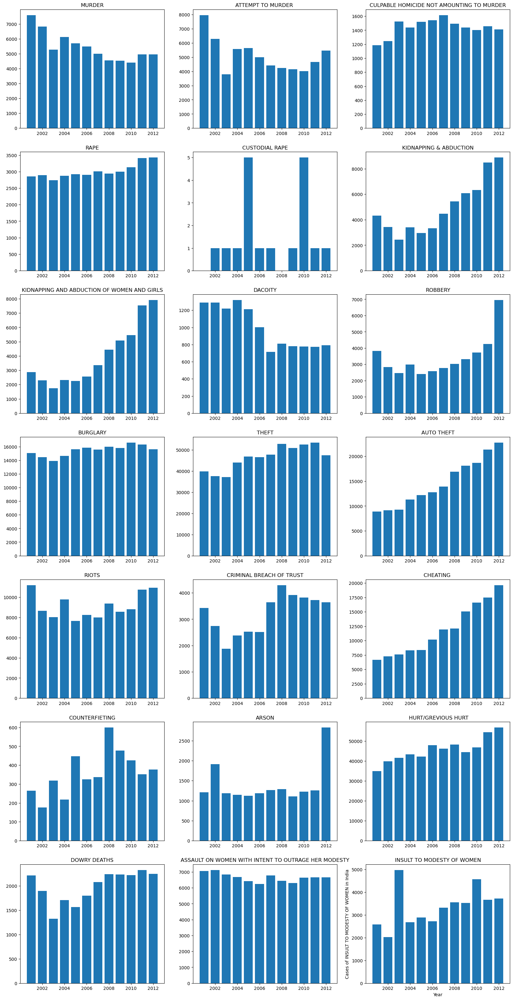

In [20]:
fig, axes = plt.subplots(7, 3, figsize=(20, 40))

axes[0,0].set_title("MURDER")
axes[0,0].bar(df['Year'], df['MURDER']);
plt.xlabel('Year')
plt.ylabel('Cases of MURDER in India')
axes[0,1].set_title("ATTEMPT TO MURDER ")
axes[0,1].bar(df['Year'], df['ATTEMPT TO MURDER']);
plt.xlabel('Year')
plt.ylabel('Cases of ATTEMPT TO MURDER in India')
axes[0,2].set_title("CULPABLE HOMICIDE NOT AMOUNTING TO MURDER")
axes[0,2].bar(df['Year'], df['CULPABLE HOMICIDE NOT AMOUNTING TO MURDER']);
plt.xlabel('Year')
plt.ylabel('Cases of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER in India')

axes[1,0].set_title("RAPE")
axes[1,0].bar(df['Year'], df['RAPE']);
plt.xlabel('Year')
plt.ylabel('Cases of RAPE in India')
axes[1,1].set_title("CUSTODIAL RAPE")
axes[1,1].bar(df['Year'], df['CUSTODIAL RAPE']);
plt.xlabel('Year')
plt.ylabel('Cases of CUSTODIAL RAPE in India')
axes[1,2].set_title("KIDNAPPING & ABDUCTION")
axes[1,2].bar(df['Year'], df['KIDNAPPING & ABDUCTION']);
plt.xlabel('Year')
plt.ylabel('Cases of KIDNAPPING & ABDUCTION in India')

axes[2,0].set_title("KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS")
axes[2,0].bar(df['Year'], df['KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS']);
plt.xlabel('Year')
plt.ylabel('Cases of KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS in India')
axes[2,1].set_title("DACOITY")
axes[2,1].bar(df['Year'], df['DACOITY']);
plt.xlabel('Year')
plt.ylabel('Cases of DACOITY in India')
axes[2,2].set_title("ROBBERY")
axes[2,2].bar(df['Year'], df['ROBBERY']);
plt.xlabel('Year')
plt.ylabel('Cases of ROBBERY in India')

axes[3,0].set_title("BURGLARY")
axes[3,0].bar(df['Year'], df['BURGLARY']);
plt.xlabel('Year')
plt.ylabel('Cases of BURGLARY in India')
axes[3,1].set_title("THEFT")
axes[3,1].bar(df['Year'], df['THEFT']);
plt.xlabel('Year')
plt.ylabel('Cases of THEFT in India')
axes[3,2].set_title("AUTO THEFT")
axes[3,2].bar(df['Year'], df['AUTO THEFT']);
plt.xlabel('Year')
plt.ylabel('Cases of AUTO THEFT in India')


axes[4,0].set_title("RIOTS")
axes[4,0].bar(df['Year'], df['RIOTS']);
plt.xlabel('Year')
plt.ylabel('Cases of RIOTS')
axes[4,1].set_title("CRIMINAL BREACH OF TRUST")
axes[4,1].bar(df['Year'], df['CRIMINAL BREACH OF TRUST']);
plt.xlabel('Year')
plt.ylabel('Cases of CRIMINAL BREACH OF TRUST in India')
axes[4,2].set_title("CHEATING ")
axes[4,2].bar(df['Year'], df['CHEATING']);
plt.xlabel('Year')
plt.ylabel('Cases of CHEATING in India')

axes[5,0].set_title("COUNTERFIETING")
axes[5,0].bar(df['Year'], df['COUNTERFIETING']);
plt.xlabel('Year')
plt.ylabel('Cases of COUNTERFIETING in India') 
axes[5,1].set_title("ARSON")
axes[5,1].bar(df['Year'], df['ARSON']);
plt.xlabel('Year')
plt.ylabel('Cases of ARSON in India')
axes[5,2].set_title(" HURT/GREVIOUS HURT")
axes[5,2].bar(df['Year'], df['HURT/GREVIOUS HURT']);
plt.xlabel('Year')
plt.ylabel('Cases of HURT/GREVIOUS HURT in India')

axes[6,0].set_title("DOWRY DEATHS")
axes[6,0].bar(df['Year'], df['DOWRY DEATHS']);
plt.xlabel('Year')
plt.ylabel('Cases of DOWRY DEATHS in India')
axes[6,1].set_title("ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY")
axes[6,1].bar(df['Year'], df['ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY']);
plt.xlabel('Year')
plt.ylabel('Cases of ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY in India')
axes[6,2].set_title("INSULT TO MODESTY OF WOMEN")
axes[6,2].bar(df['Year'], df['INSULT TO MODESTY OF WOMEN']);
plt.xlabel('Year')
plt.ylabel('Cases of INSULT TO MODESTY OF WOMEN in India')


### Observations:
Over the years:
-Rapes, kidnappings, Robbery,Auto Theft, Cheating, Grievious Hurt,Arson__, has shown an increasing trend
-Murder , Attempt to Murder and Daocity__ has shown an decreasing trend
-Burglary,Dowry Deaths, Assault on women wth intent to outrage her modesty,Culpable Homicide, Counterfieting not amounting to murder do not show any trend.
-Custodial Rape__ shows  few peaks.


## Plotting Pie chart for different crimes

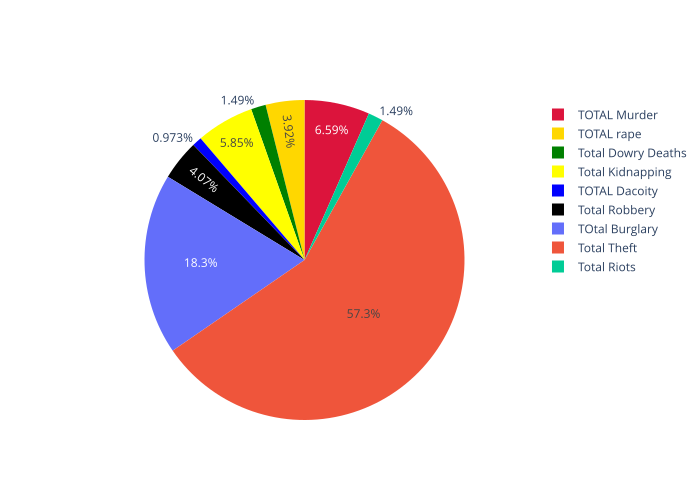

In [21]:
tot_murder= df['MURDER'].sum()
tot_rape= df['RAPE'].sum()
tot_dowrydeaths = df['DOWRY DEATHS'].sum()

tot_kidnap= df['KIDNAPPING & ABDUCTION'].sum()
tot_dacoity= df['DACOITY'].sum()
tot_robbery = df['ROBBERY'].sum()
tot_burglary= df['BURGLARY'].sum()
tot_theft= df['THEFT'].sum()
tot_riots = df['DOWRY DEATHS'].sum()

crime_group = ['TOTAL Murder','TOTAL rape','Total Dowry Deaths','Total Kidnapping','TOTAL Dacoity','Total Robbery','TOtal Burglary','Total Theft','Total Riots']
values = [tot_murder,tot_rape,tot_dowrydeaths,tot_kidnap,tot_dacoity,tot_robbery,tot_burglary,tot_theft,tot_riots]

colors = ['crimson','gold','green','yellow','blue','black']

fig = go.Figure(data=[go.Pie(labels=crime_group, values=values,sort=False,
                            marker=dict(colors=colors),textfont_size=12)])

fig.show(renderer='svg')

 Murder is the most common Crimes in each state(57%)

## State/UT VS Literacy Rate

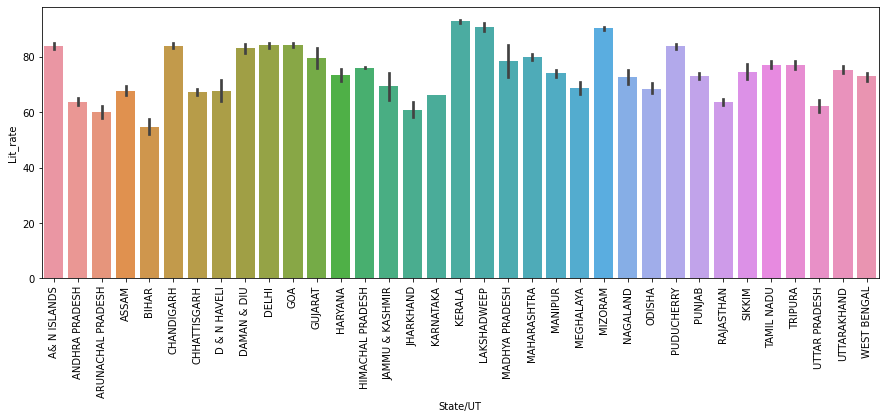

In [20]:
plt.figure(figsize=(15, 5))
sns.barplot(x='State/UT', y='Lit_rate',data=df)
plt.xticks(rotation='90')
plt.savefig("1.jpg")
plt.show()

Kerala has the Highest Litracy_rate and Bihar has the lowest Literacy rate.

### State/UT VS Total Crimes

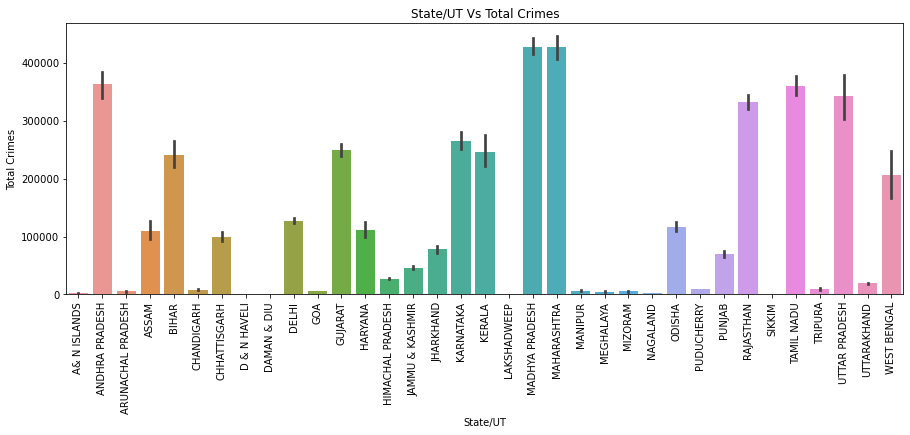

In [21]:

plt.figure(figsize=(15, 5))
sns.barplot(x=df['State/UT'], y=df['Total Crimes'])
plt.xticks(rotation='90')
plt.title('State/UT Vs Total Crimes')
plt.savefig("2.jpg")
plt.show()

- States Arunachal Praddeh,Chandigarh,D&N Haveli,,Goa,Manipur, Meghayala,MIzoram, NAgaland,Pudducheery, Sikkim has least Total crimes as compare to Madhya Pradesh,Maharashtra, Uttar Pradesh  ahs highest Total Crimes

### Year Vs Total Crimes

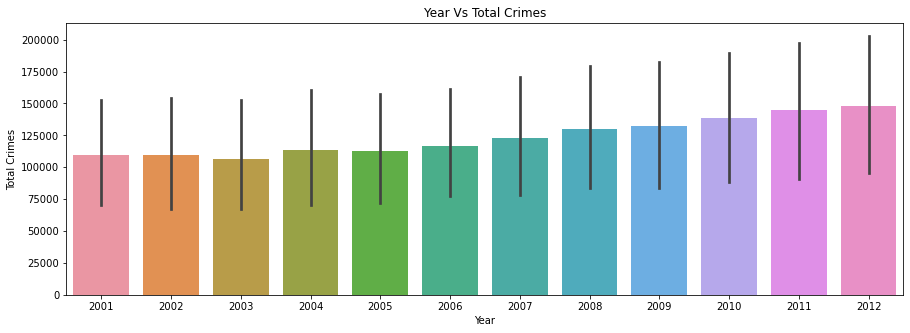

In [22]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['Year'], y=df['Total Crimes'])
plt.title('Year Vs Total Crimes')
plt.savefig("3.jpg")
plt.show()

- In year 2012 Total Crimes were Highest and 2001 was the lowest.

### State/UT VS Total Crimes Aginst SCs

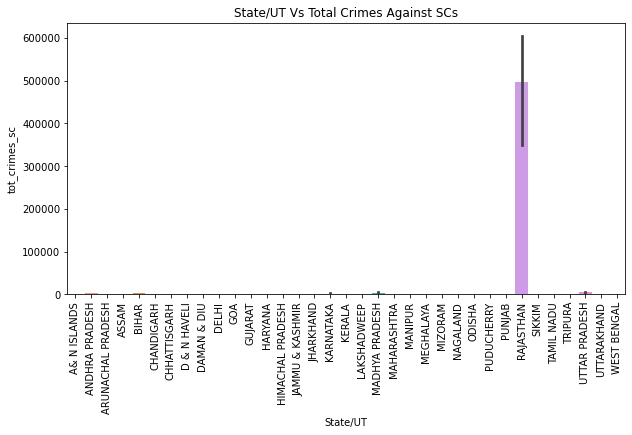

In [23]:
plt.figure(figsize=(10, 5))
sns.barplot(x=df['State/UT'], y=df['tot_crimes_sc'])
plt.xticks(rotation='90')
plt.title('State/UT Vs Total Crimes Against SCs')
plt.savefig("4.jpg")
plt.show()

- States  Rajasthan  has the highest crimes againast SCs , Andhra Pradesh, Bihar ,Karnataka,Madhya Pradesh,Uttar Pradesh has lesser Crimes against SCS

### State/UT Vs Total Crimes against STs

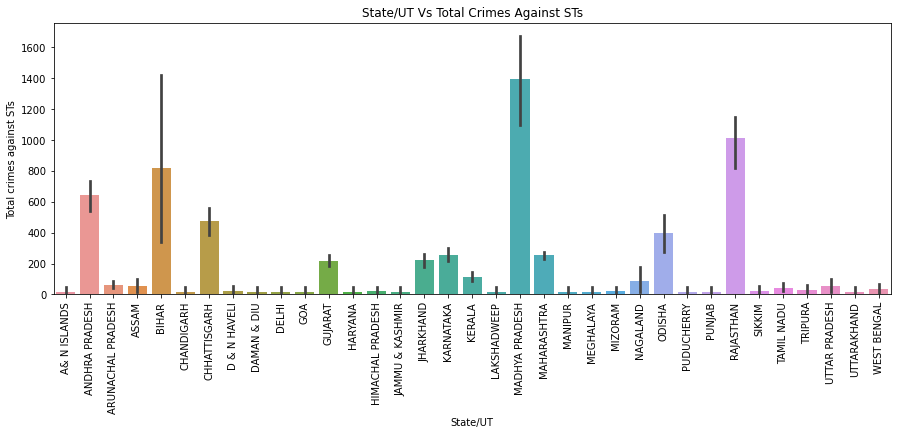

In [24]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['State/UT'], y=df['Total crimes against STs'])
plt.xticks(rotation='90')
plt.title('State/UT Vs Total Crimes Against STs')
plt.savefig("5.jpg")
plt.show()

- Madhya Pradesh , rajasthan Has higher crimes against STs and Manipur, A & N Island has lowest crimes against STs.

### State/UT Vs Total Crimes Against Children

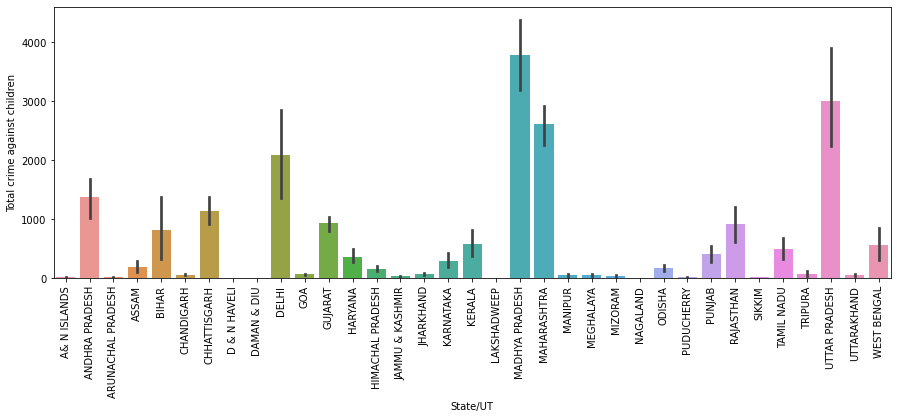

In [30]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['State/UT'], y=df['Total crime against children'])
plt.xticks(rotation='90')
plt.title('State/UT Vs Total Crimes Against Children')
plt.savefig("6.jpg")
plt.show()

- MP, UP has the Highest Crimes against Children while D & N Haveli, Daman,& Diu has the lowest Crimes against Children

### State/UT Vs Total Crime against Women

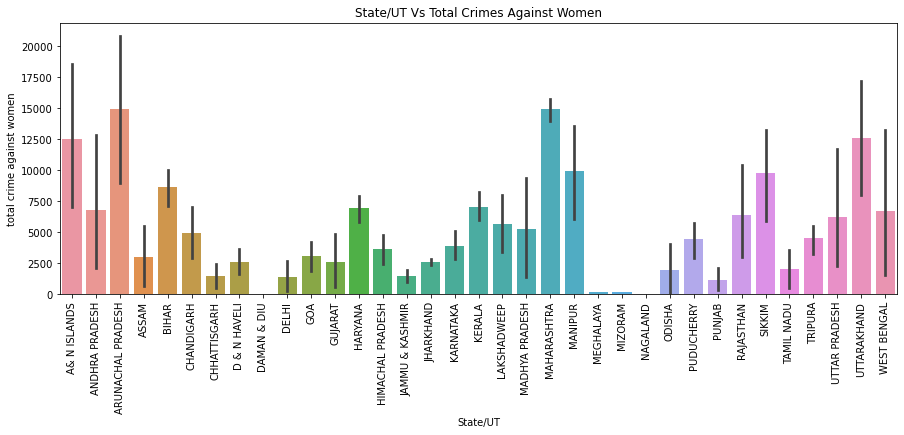

In [25]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['State/UT'], y=df['total crime against women'])
plt.xticks(rotation='90')
plt.title('State/UT Vs Total Crimes Against Women')
plt.savefig("7.jpg")
plt.show()

Only Mizoram and Meghalya are the only states which has lesser crime against women and Nagaland has almost 0 crimes against Women.
Other states have more crimes against Women 

### Year vs Litearcy Rate


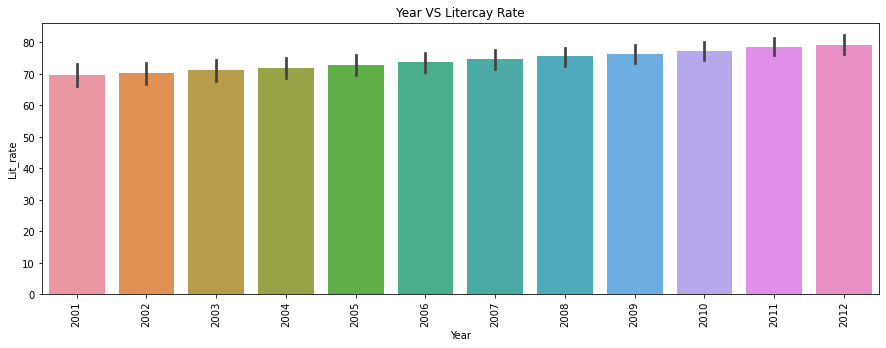

In [26]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['Year'], y=df['Lit_rate'])
plt.xticks(rotation='90')
plt.title('Year VS Litercay Rate')
plt.savefig("8.jpg")
plt.show()

- Litearcy rate for years has been increasin from 2001

### Year Vs Population Literacy

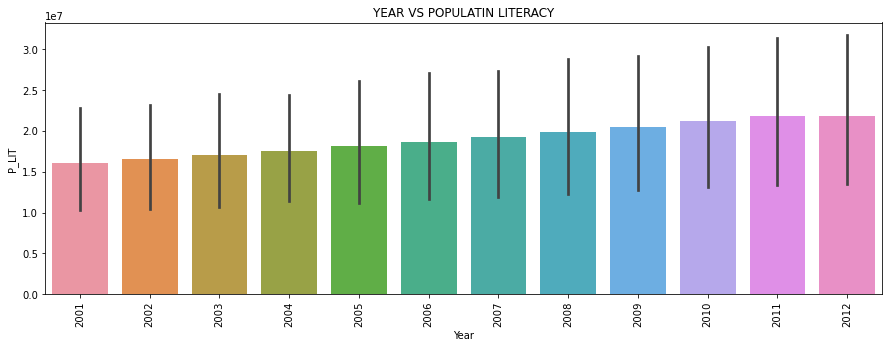

In [27]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['Year'], y=df['P_LIT'])
plt.xticks(rotation='90')
plt.title('YEAR VS POPULATIN LITERACY')
plt.savefig("9.jpg")
plt.show()

### year Vs Male Literacy

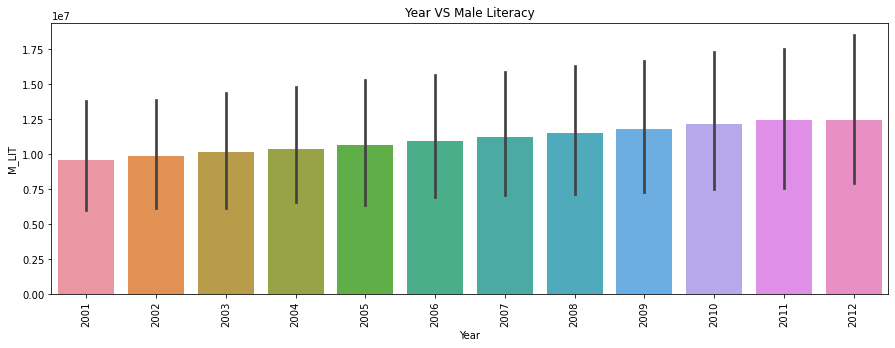

In [28]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['Year'], y=df['M_LIT'])
plt.xticks(rotation='90')
plt.title('Year VS Male Literacy')
plt.savefig("10.jpg")
plt.show()

### Year VS Female Literacy

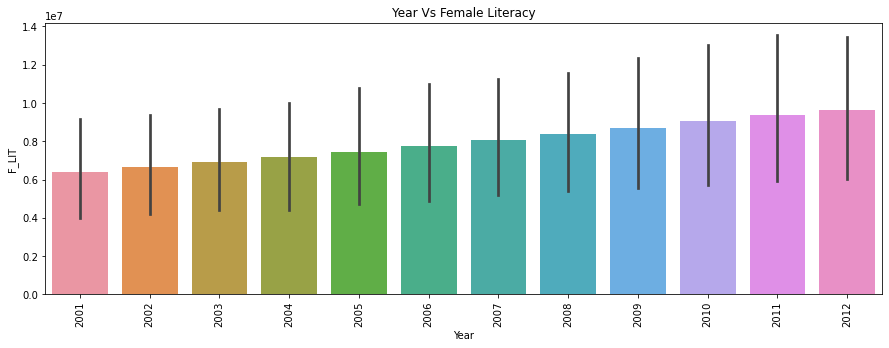

In [29]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df['Year'], y=df['F_LIT'])
plt.xticks(rotation='90')
plt.title('Year Vs Female Literacy')
plt.savefig("11.jpg")
plt.show()

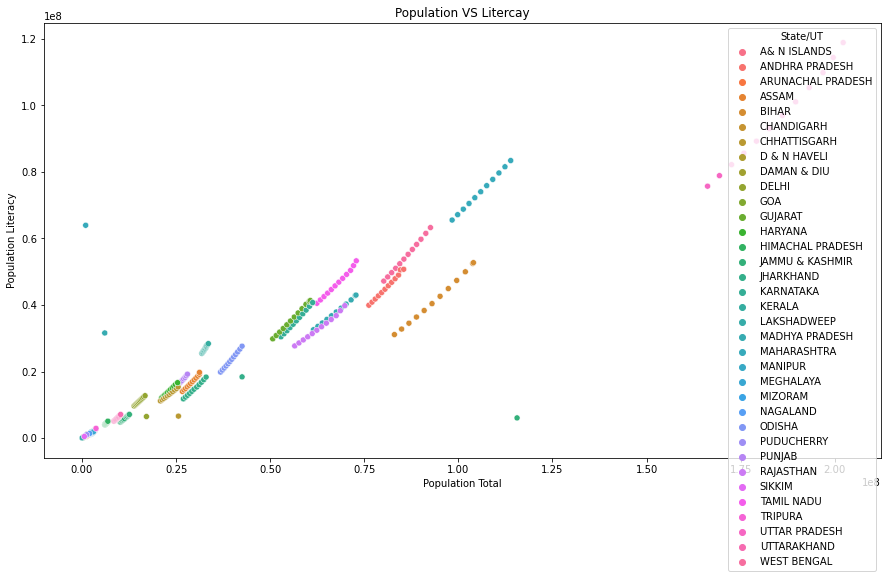

In [31]:
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['population(total)'], y=df['P_LIT'],hue=df['State/UT'])
plt.xlabel('Population Total')
plt.ylabel('Population Literacy')
plt.title('Population VS Litercay')
plt.savefig("11.jpg")
plt.show()

In every state/UT , Population is increasing so does Literacy

# Exploratory Data Analysis<br>

## 2.1 Analysis of Literacy Rate vs Total Crimes.

In [22]:
new_df=df[['State/UT','Year','Lit_rate', 'Total Crimes', 'tot_crimes_sc', 'total crime against women',
       'Total crimes against STs','Total crime against children']]
new_df

,State/UT,Year,Lit_rate,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children
0,A& N ISLANDS,2001,81.30,1386,0,34.0,1.0,0.0
1,ANDHRA PRADESH,2001,60.47,278982,2933,13669.0,512.0,270.0
2,ARUNACHAL PRADESH,2001,54.34,5243,0,180.0,72.0,0.0
3,ASSAM,2001,63.25,81418,6,4048.0,0.0,18.0
4,BIHAR,2001,47.00,189612,1303,4489.0,83.0,83.0
...,...,...,...,...,...,...,...,...
415,TAMIL NADU,2012,80.88,415626,1647,6381.0,27.0,1036.0
416,TRIPURA,2012,80.89,13461,76,1559.0,29.0,20.0
417,UTTAR PRADESH,2012,67.98,444403,6202,23033.0,44.0,6033.0
418,UTTARAKHAND,2012,79.22,20122,33,1055.0,3.0,122.0


In [23]:
new_df.corr()

,Year,Lit_rate,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children
Year,1.000000,0.314890,0.094007,0.048076,0.150851,0.060426,0.229476
Lit_rate,0.314890,1.000000,-0.167573,-0.163993,-0.011096,-0.253828,0.014062
Total Crimes,0.094007,-0.167573,1.000000,0.242294,0.155126,0.547101,0.728111
tot_crimes_sc,0.048076,-0.163993,0.242294,1.000000,0.035324,0.359817,0.084627
total crime against women,0.150851,-0.011096,0.155126,0.035324,1.000000,0.095342,0.176379
Total crimes against STs,0.060426,-0.253828,0.547101,0.359817,0.095342,1.000000,0.484496
Total crime against children,0.229476,0.014062,0.728111,0.084627,0.176379,0.484496,1.000000


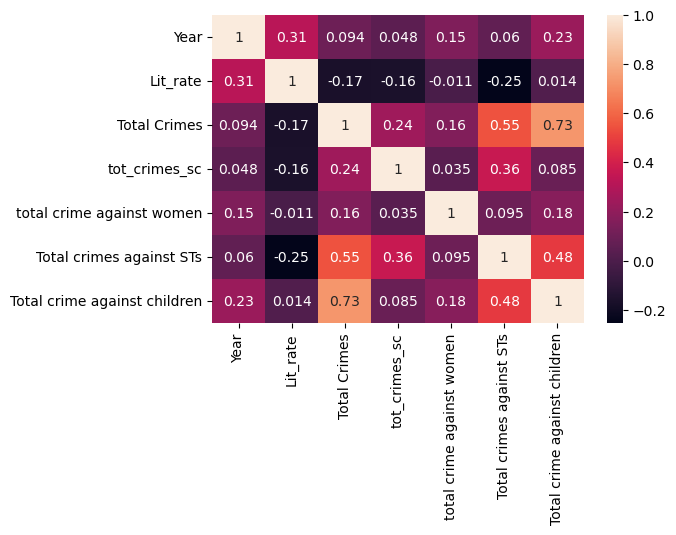

In [24]:
plt.figure(figsize=(6,4))
sns.heatmap(new_df.corr(),annot=True)
plt.savefig('heatmap1.jpg')
plt.show()


I see that the above heatmap shows the correlation matrix data wherein there are positive as well as negative correlations between the target label and other feture columns. A zero correlation indicates that there is no relationship between the variables. Looking at the above representation I see that quality column is positively correlated with alcohol and it is negatively correlated with the volatile acidity. The quality column is least correlated with residual sugar showing a coefficient value of 0.014 that close to 0. Similarly we can bifurcate all the other positively and negatively correlated feature columns with respect to the target label.

Also there are some highly positive and negative correlated feature columns that can pose the concern for multicollinearity. If the correlation coefficient, assuming it to be the variable 'r', is exactly +1 or -1, then it is called perfect multicollinearity. But even if this 'r' is close to -1 or +1 then one of the features should be removed from the model if at all possible.

- __Lit_rate is Negatively corelated with  the Tootal Crimes,, 'tot_crimes_sc', 'total crime against women','Total crimes against STs', 'Total crime against children'__<br>

In [25]:
import plotly.io as pio
pio.renderers.default = 'svg'


import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

### Literacy rate VS Total Crimes

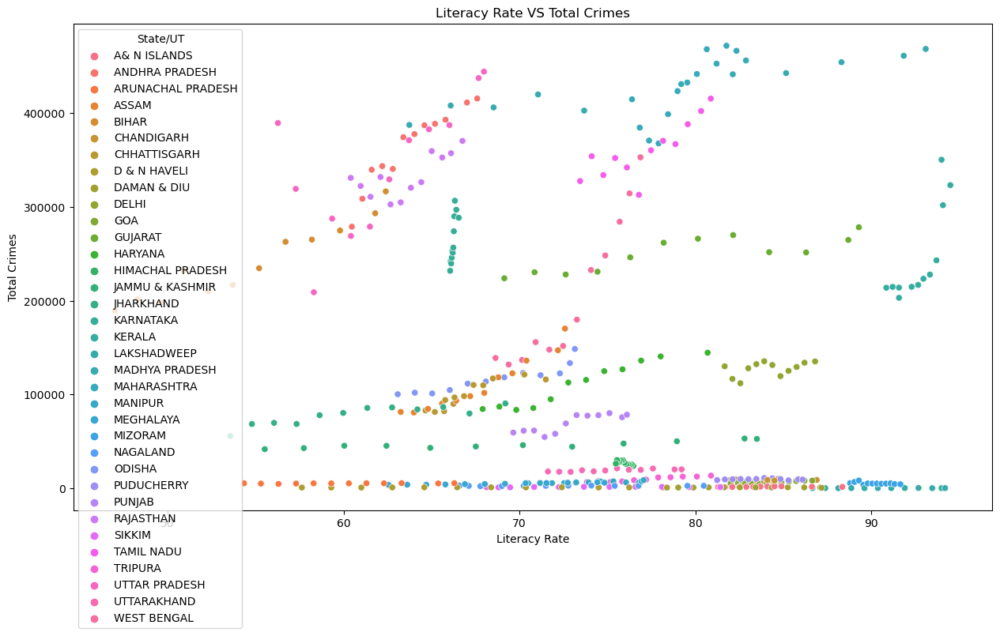

In [26]:
#plotting scatter plot
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['Lit_rate'], y=df['Total Crimes'],hue=df['State/UT'])
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes')
plt.title('Literacy Rate VS Total Crimes')
plt.savefig("12.jpg")
plt.show()


Higher the Literacy rate lower the Total Crimes.

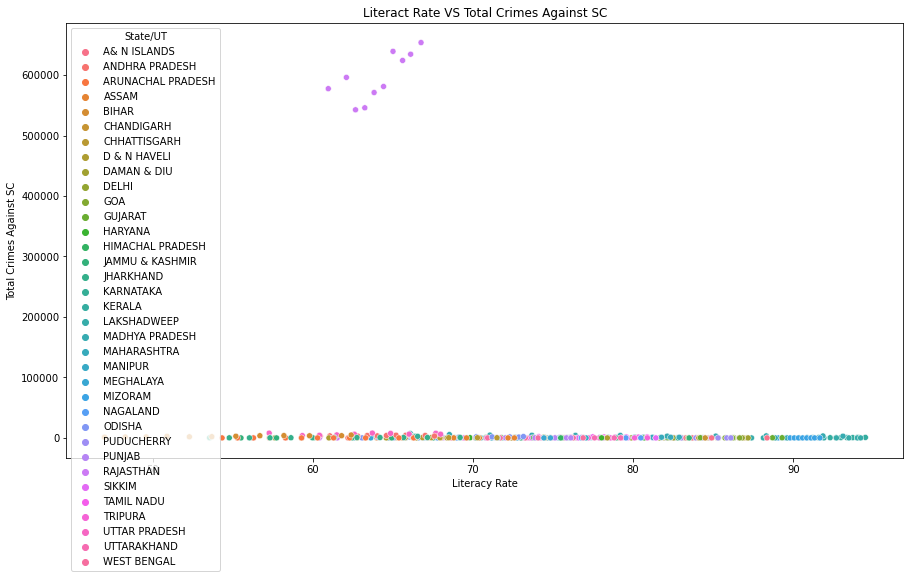

In [45]:
## Literacy Rate VS Tot Crimes SC
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['Lit_rate'], y=df['tot_crimes_sc'],hue=df['State/UT'])
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes Against SC')
plt.title('Literact Rate VS Total Crimes Against SC')
plt.savefig("13.jpg")
plt.show()


If Litercay Rate keep on increasing, there is decline in the tot_crimes_sc

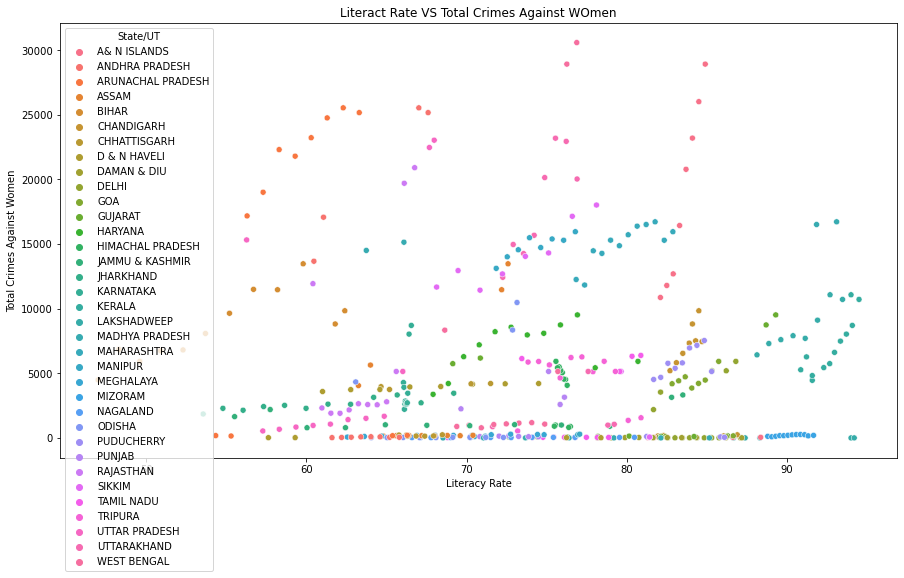

In [46]:
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['Lit_rate'], y=df['total crime against women'],hue=df['State/UT'])
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes Against Women')
plt.title('Literact Rate VS Total Crimes Against WOmen')
plt.savefig("14.jpg")
plt.show()

For each state Total crime against women kept decreasing with the increament in Literacy rate.

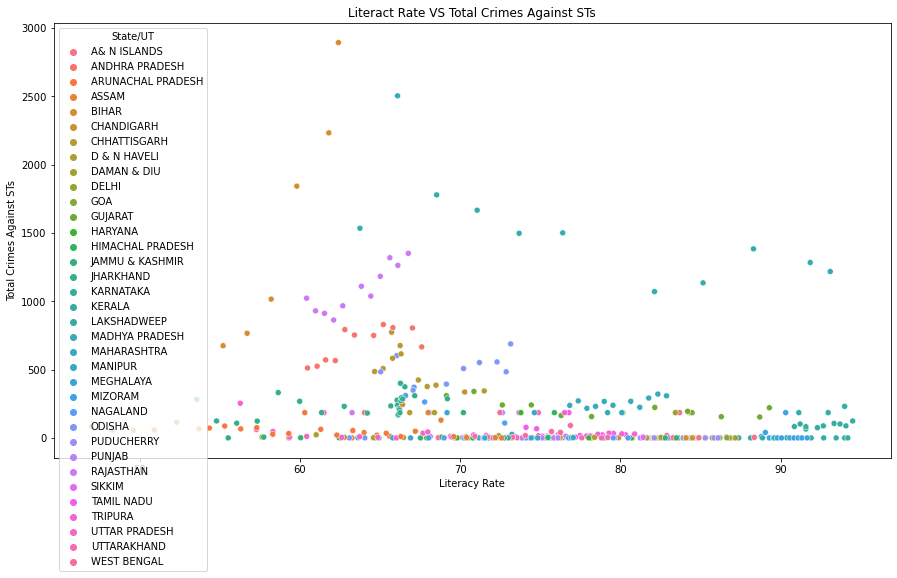

In [47]:
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['Lit_rate'], y=df['Total crimes against STs'],hue=df['State/UT'])
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes Against STs')
plt.title('Literact Rate VS Total Crimes Against STs')
plt.savefig("15.jpg")
plt.show()

For STs-Lit_rate is negatively correlated with Total crimes.

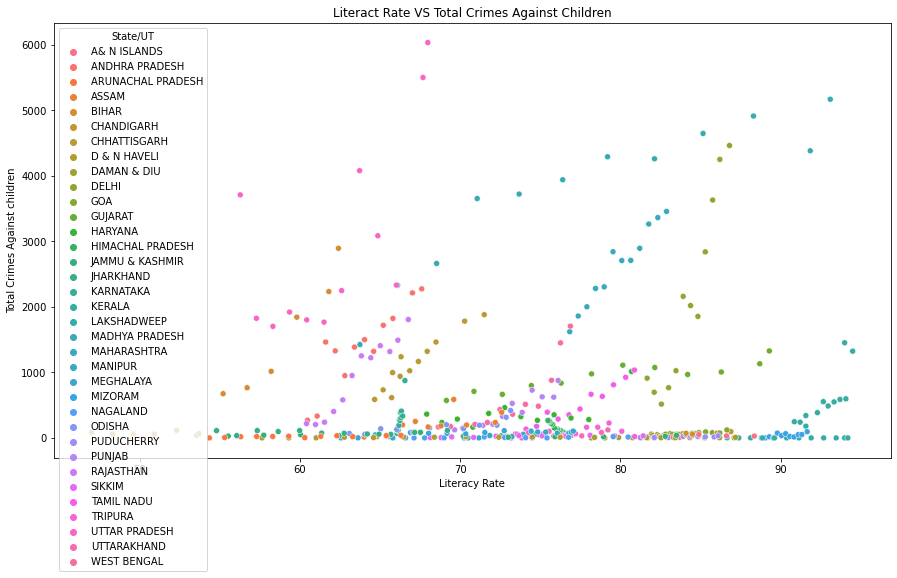

In [48]:
plt.figure(figsize=(15, 8))
sns.scatterplot(x=df['Lit_rate'], y=df['Total crime against children'],hue=df['State/UT'])
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes Against children')
plt.title('Literact Rate VS Total Crimes Against Children')
plt.savefig("16.jpg")

plt.show()

For childern - Lit_rate is negatively correlated with Total crimes

## 2.2  Analysis of the type of crime vs each state vs Literacy rate.

### State Vs MURDER Vs Litercay Rate

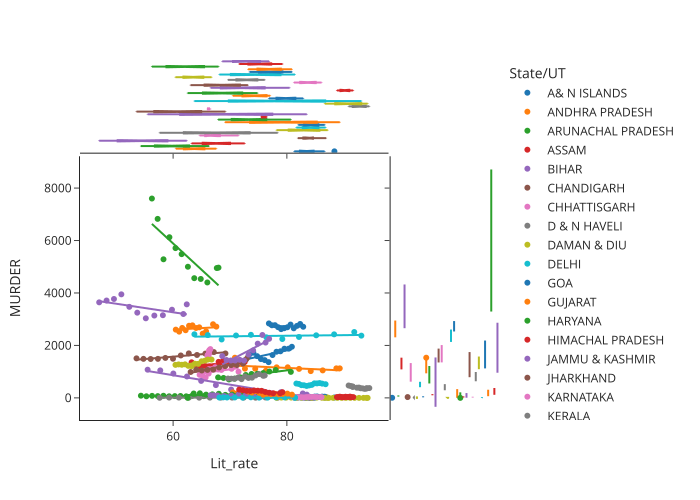

In [27]:
fig = px.scatter(df, x="Lit_rate", y="MURDER", color="State/UT", marginal_y="violin",
           marginal_x="box",  trendline='ols',template="simple_white")
fig.show(renderer='svg')

In states with higher Litercay rate rate the count of MURDER cases decresing 

### EACH STATE VS LIT RATE VS ATTEMT TO MURDER CRIME

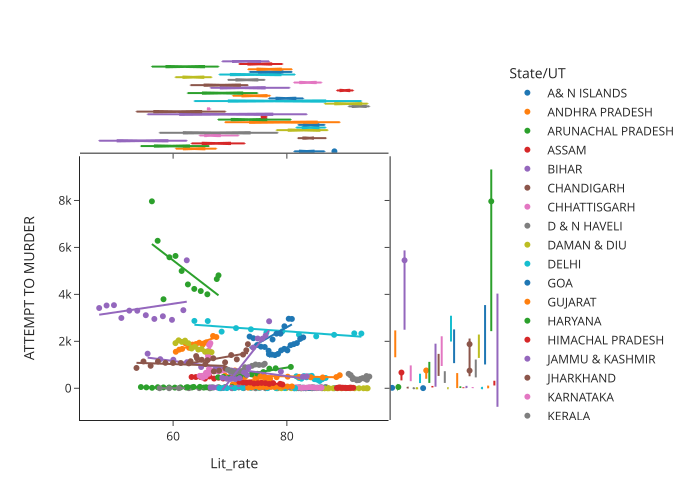

In [28]:
fig = px.scatter(df, x="Lit_rate", y="ATTEMPT TO MURDER", color="State/UT", marginal_y="violin",
           marginal_x="box",  trendline='ols',template="simple_white")
fig.show(renderer='svg')

UTTAR PRADESH has the highest number f ATTEMP TO MURDER CASES(7964 with LIT_rate 56.2)
Lakshdweep State has 0 ATTEMP TO MURDER CASES with Literacy 94.2 which is th highest for mentioned states

### EACH State VS RAPE VS Lit_rate

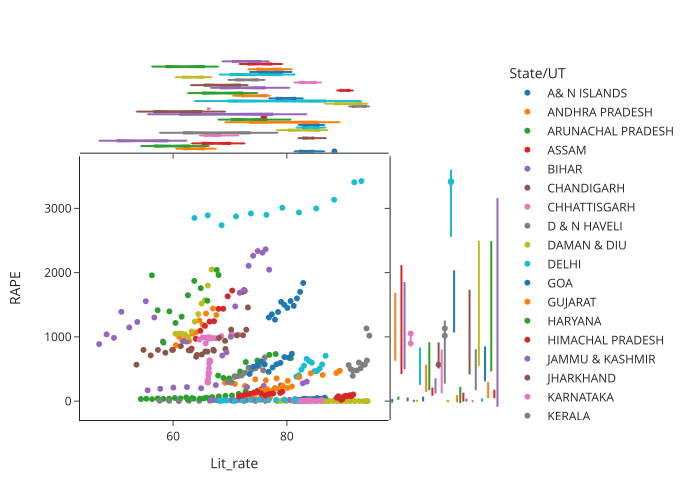

In [29]:
fig = px.scatter(df, x="Lit_rate", y="RAPE", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

MP has Highest Number of Rape cases while Lakshdweep has Lowest Rape Cases 0.

### EACH State VS CULPABLE HOMICIDE NOT AMOUNTING TO MURDER VS Lit_rate

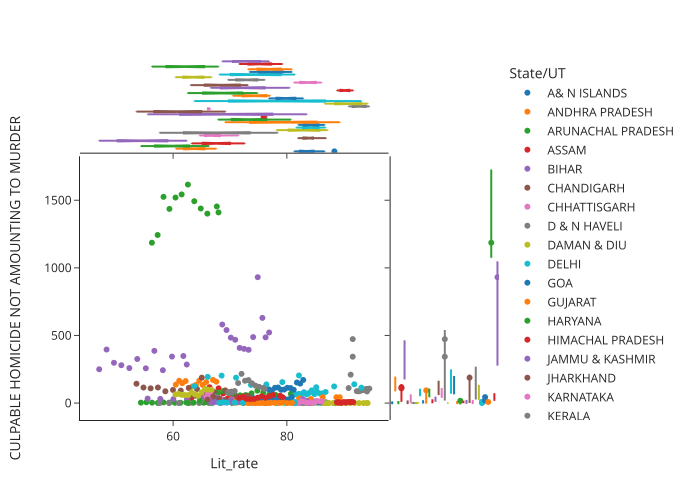

In [30]:
fig = px.scatter(df, x="Lit_rate", y="CULPABLE HOMICIDE NOT AMOUNTING TO MURDER", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

- __Only UP has the CULPABLE HOMICIDE NOT AMOUNTING TO MURDER cases around 1418 and states likes AP, Tripura,SIKKIM,Lakshdeep has minim CULPABLE HOMICIDE NOT AMOUNTING TO MURDER like 3,6,0 etc__

### Each state VS Lit rate VS Type of CRIME(CUSTODIAL RAPE)

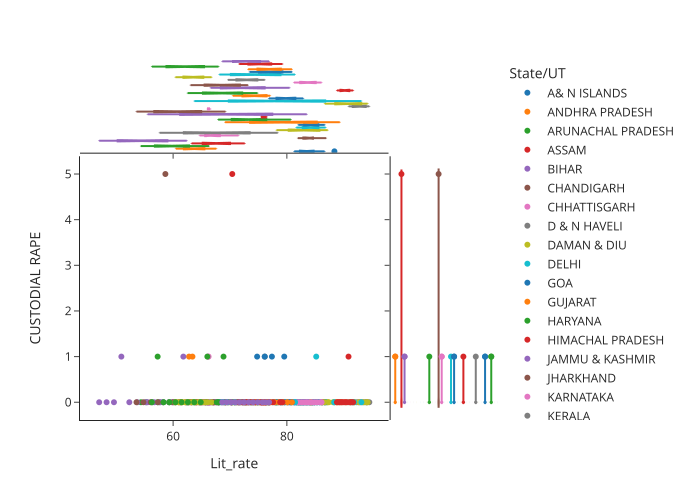

In [31]:
fig = px.scatter(df, x="Lit_rate", y="CUSTODIAL RAPE", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

Kerala with 94 Litracy rate has 0 Custodial rape
Assam with 70 Litracy Rate has 5 Custodial Rape which was MAximum in the category of Custodial Rape

### Each State VS Lit Rate VS Type of crime(KIDNAPPING & ABDUCTION)

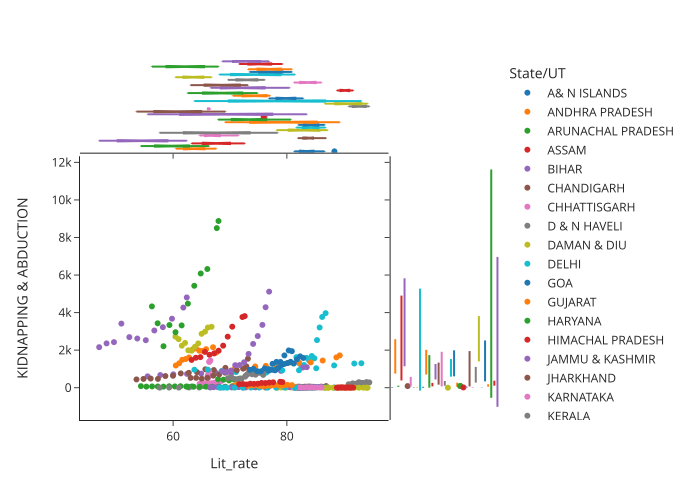

In [32]:
fig = px.scatter(df, x="Lit_rate", y="KIDNAPPING & ABDUCTION", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')


KIDNAPPING & ABDUCTION cases mostly are in Uttar Pradesh, West Bengal and BIHAR

### Each state vs Lit rate VS type of Crime(KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS)


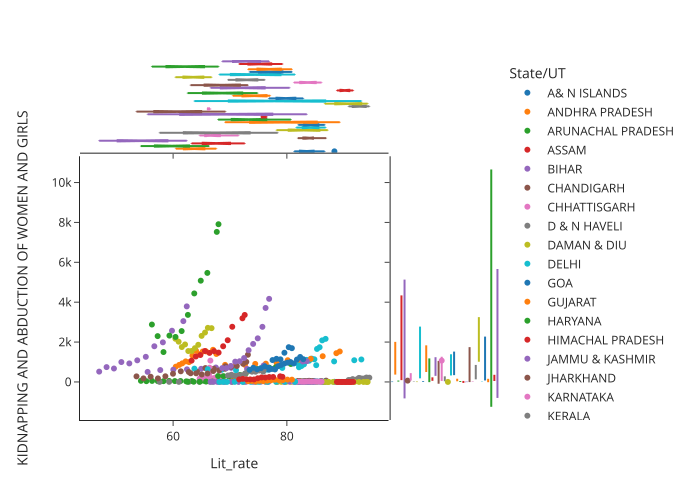

In [33]:
fig = px.scatter(df, x="Lit_rate", y="KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Uttar Pradesh has highest nmber and Lakshdeep has 0 KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS cases

### Each state vs Lit rate VS type of crime(DACOITY)

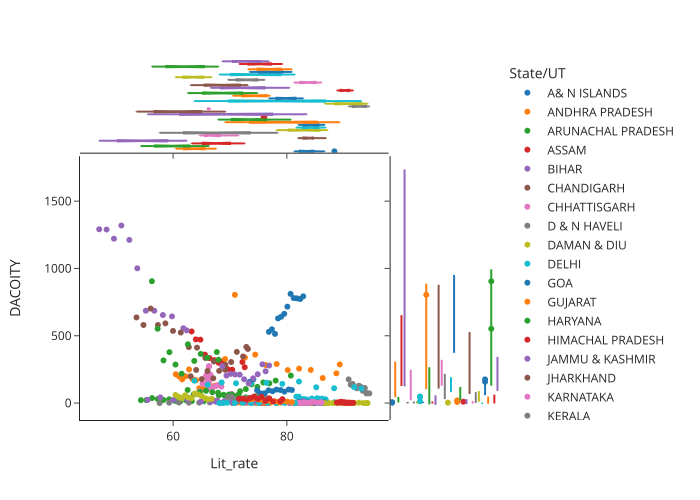

In [34]:
fig = px.scatter(df, x="Lit_rate", y="DACOITY", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

- Bihar ,UTTAR PRADESH, and MAharshtra are the top 3 states with highest Daocity cases.

- Tripura, Sikkim , MAnipur has the lowset daocity cases..

## Each state VS Lit rate VS Type of Crime(ROBBERY)

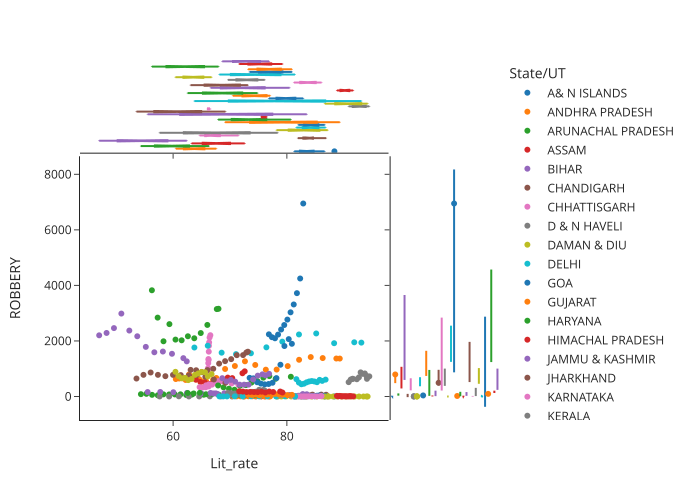

In [35]:
fig = px.scatter(df, x="Lit_rate", y="ROBBERY", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

- Maharashtra state has 6949 cases and Laksdweep ha 0 Robbery cases

### Each state VS Lit Rate VS Type of Crime(BURGLARY)

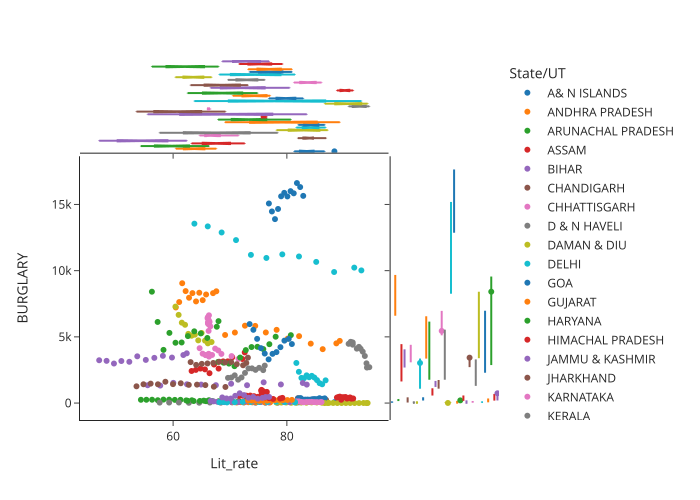

In [36]:
fig = px.scatter(df, x="Lit_rate", y="BURGLARY", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Maharashta has around 15000 cases of BURGLARY and Lakshdweep has 3 BURGLARY cases


### Each State VS Lit rate VS Type of Crime(THEFT)

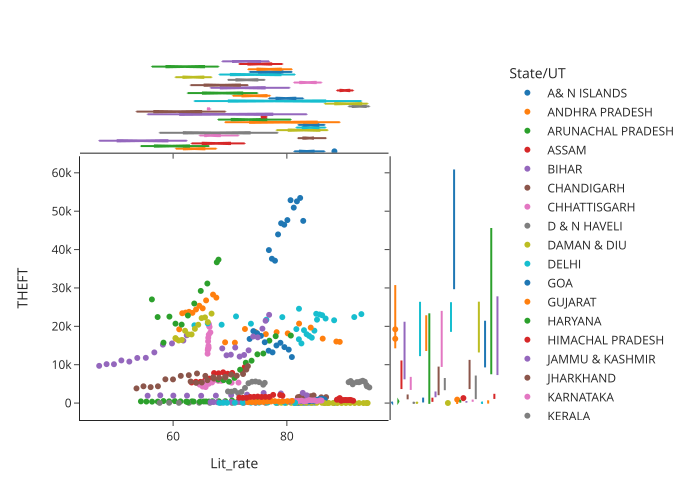

In [37]:
fig = px.scatter(df, x="Lit_rate", y="THEFT", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Maharashtra has around 50K (highest)cases of THEFT and Lakshdweep has 7(Lowest) cases of THEFT.

### Each State VSLit rate VS Type of Crime(AUTO THEFT)

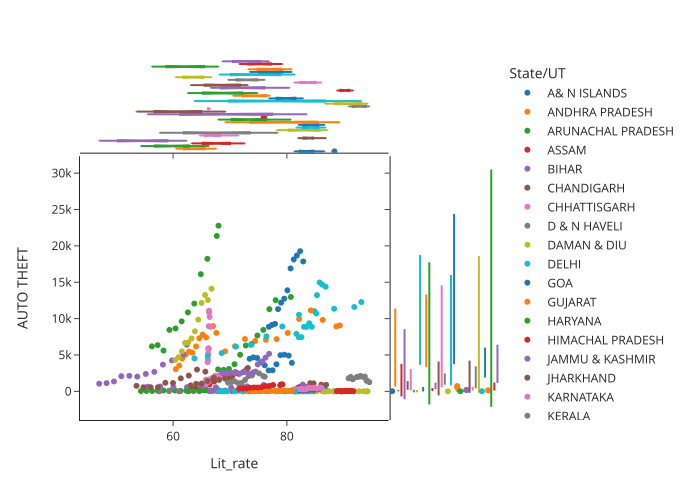

In [38]:
fig = px.scatter(df, x="Lit_rate", y="AUTO THEFT", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Uttar Pradesh has 22000(highest)AUTO THEFT cases where else Laksdweep has 1 AUTO THEFT caseswhich is the Lowest

### Each state VS Lit rate VS Type of Crime(RIOTS)

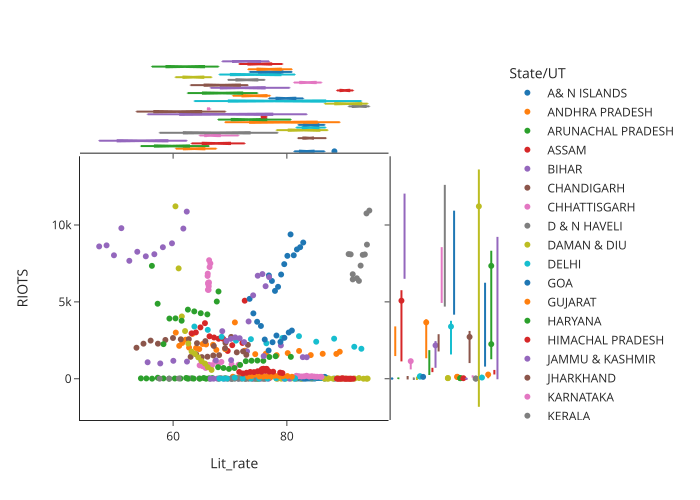

In [39]:
fig = px.scatter(df, x="Lit_rate", y="RIOTS", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Mizoram(91.33 Litracy rate) has 0 (Lowest)Riots  cases whie the Rajasthan(Lit rate 60.1) has 11.2K(highest) Caese of Riots which is the Highest

### Each State VS Litracy Rate VS Type of  Crime(CRIMINAL BREACH OF TRUST)

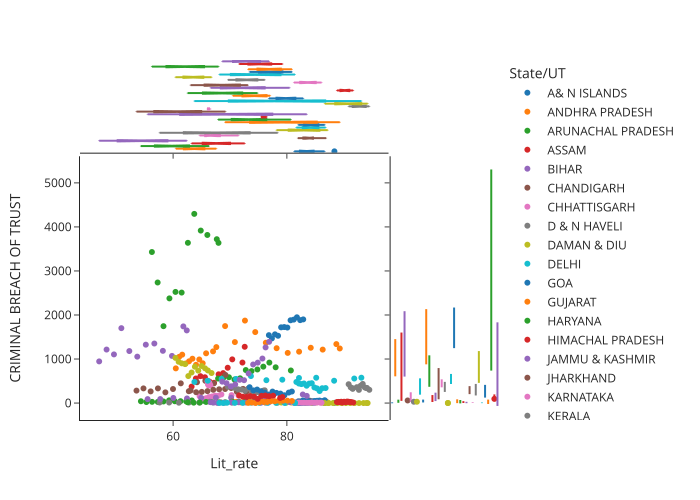

In [40]:
fig = px.scatter(df, x="Lit_rate", y="CRIMINAL BREACH OF TRUST", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-UP has CRIMINAL BREACH OF TRUST caes around 4296(highest) and Laksdweep has 0 CRIMINAL BREACH OF TRUST


### Each State VS Lit rate VS Type of Crime(CHEATING)

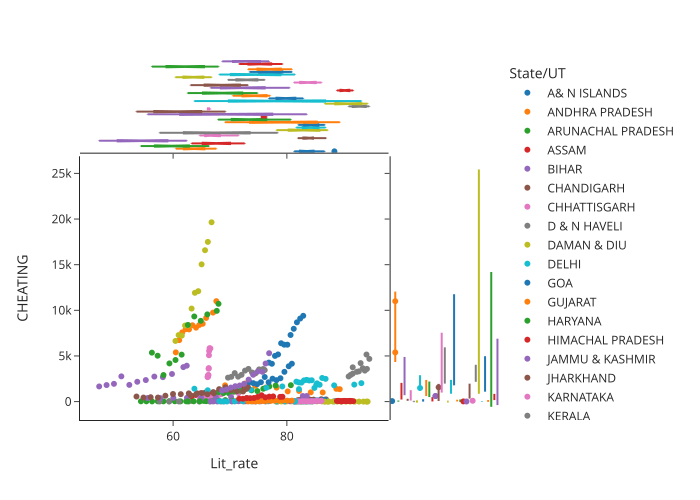

In [41]:
fig = px.scatter(df, x="Lit_rate", y="CHEATING", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-Rajasthan has highest cases of Cheating 19.46K and Lakshdweep has lowest cases 0

### Each state VS Lit rate vs Type of Crime(COUNTERFIETING)


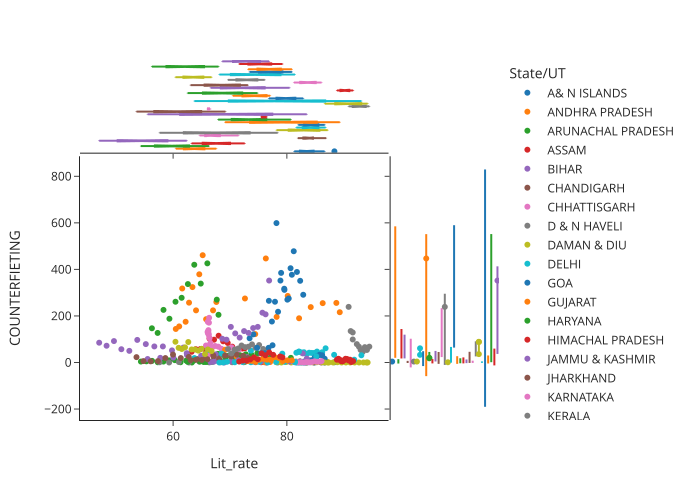

In [42]:
fig = px.scatter(df, x="Lit_rate", y="COUNTERFIETING", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Tamil Nadu has highest numbers of COUNTERFIETING cases 599 and Lkshdweep has 0 COUNTERFIETING cases

### Each state VS Lit rate vs Type of Crime(ARSON)

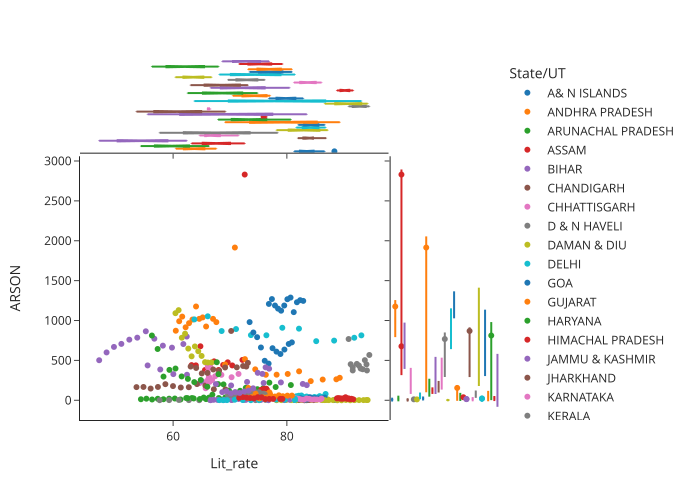

In [43]:
fig = px.scatter(df, x="Lit_rate", y="ARSON", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Assam has highest numbers of ARSON cases 2830 and Lkshdweep has 3 ARSON cases

### Each state VS Lit rate vs Type of Crime(HURT/GREVIOUS HURT)

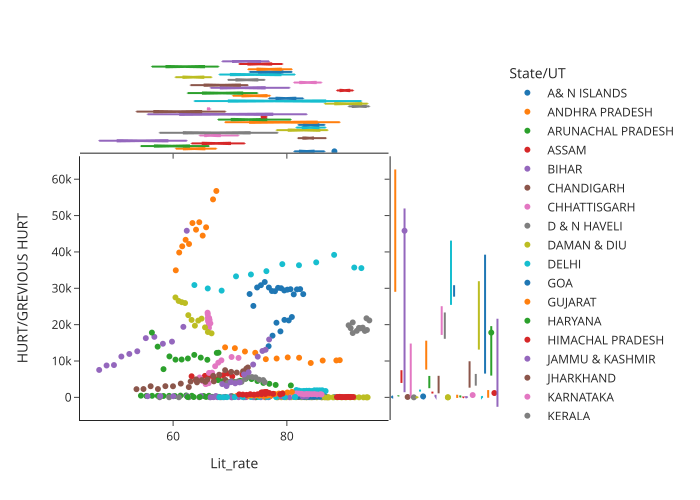

In [44]:
fig = px.scatter(df, x="Lit_rate", y="HURT/GREVIOUS HURT", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-state Tamil Nadu has highest numbers of HURT/GREVIOUS HURT cases 56.7K and Lakshdweep has 1 HURT/GREVIOUS HURT cases

### Each state VS Lit rate vs Type of Crime(DOWRY DEATHS)

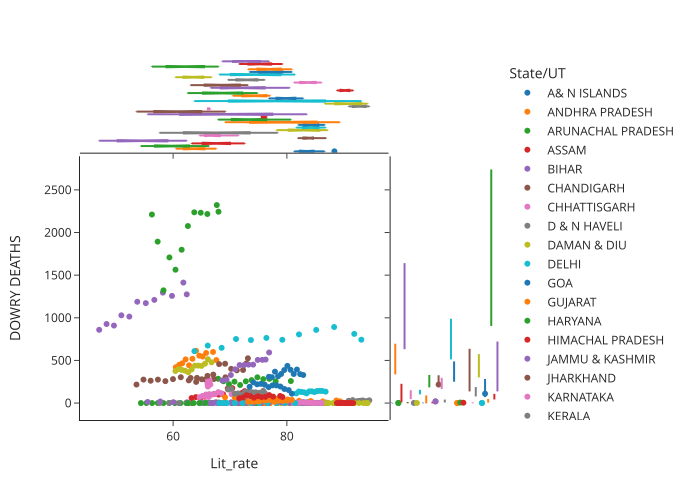

In [45]:
fig = px.scatter(df, x="Lit_rate", y="DOWRY DEATHS", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Assam has highest numbers of Dowry Death 2322 cases 2830 and Lkshdweep has 0 Dowry Death cases

### Each state VS Lit rate vs Type of Crime(INSULT TO MODESTY OF WOMEN)

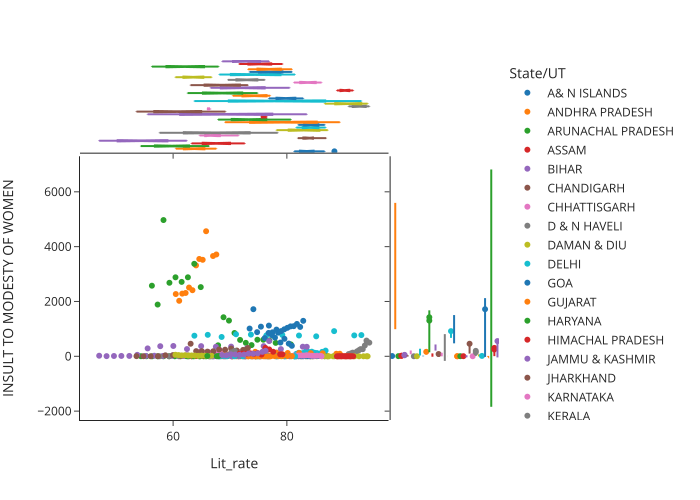

In [46]:
fig = px.scatter(df, x="Lit_rate", y="INSULT TO MODESTY OF WOMEN", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Uttar Pradesh  has highest numbers of Insult to Modest of women 4970 cases 2830 and Lkshdweep has 0 Insult to Modest of women  cases

### Each state VS Lit rate vs Type of Crime(CRUELTY BY HUSBAND OR HIS RELATIVES)

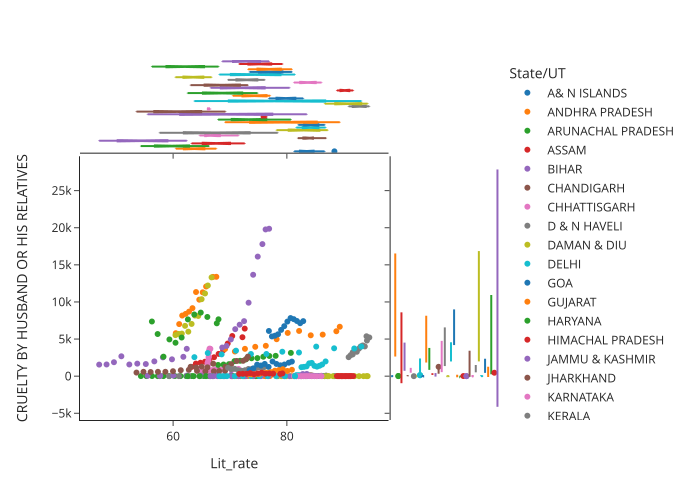

In [47]:
fig = px.scatter(df, x="Lit_rate", y="CRUELTY BY HUSBAND OR HIS RELATIVES", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State West Bengal has highest numbers of CRUELTY BY HUSBAND OR HIS RELATIVES 19.36K cases and Lkshdweep has 0 CRUELTY BY HUSBAND OR HIS RELATIVES

### Each state VS Lit rate vs Type of Crime(IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES)

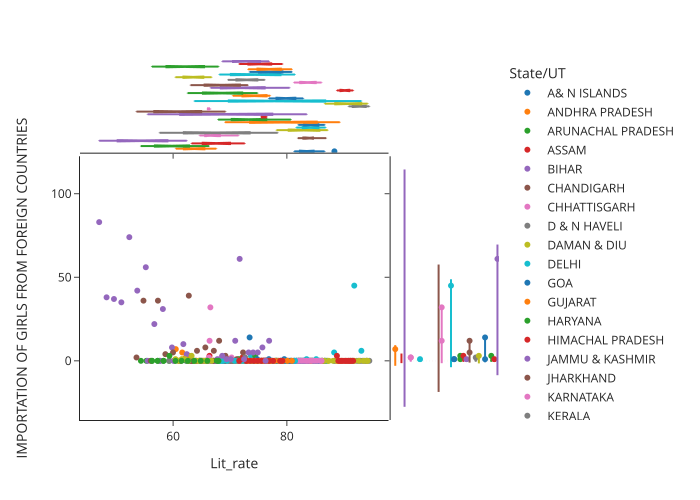

In [48]:
fig = px.scatter(df, x="Lit_rate", y="IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Bihar has 83 (highest) numbers of IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES cases 2830 and Lakshdweep,Kerala,Mizoram have 0 IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES cases

### Each state VS Lit rate vs Type of Crime(CAUSING DEATH BY NEGLIGENCE)

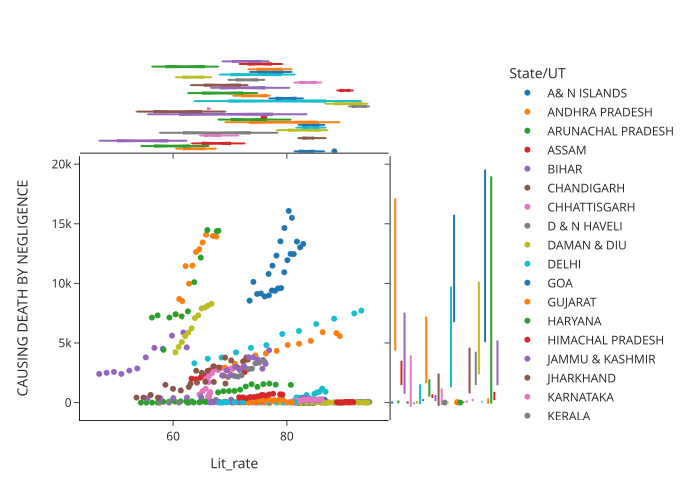

In [49]:
fig = px.scatter(df, x="Lit_rate", y="CAUSING DEATH BY NEGLIGENCE", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Tamil Nadu has 16.07K (highest) numbers of CAUSING DEATH BY NEGLIGENCE cases and Lakshdweep have 0 CAUSING DEATH BY NEGLIGENCE cases

### Each state VS Lit rate vs Type of Crime(OTHER IPC CRIMES)

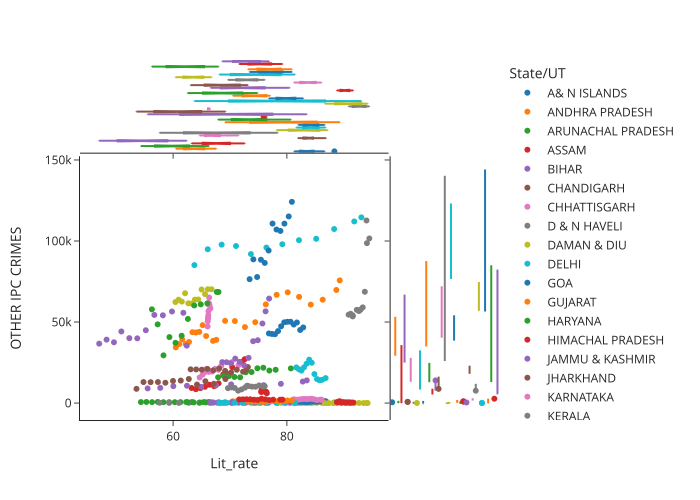

In [50]:
fig = px.scatter(df, x="Lit_rate", y="OTHER IPC CRIMES", color="State/UT", marginal_y="violin",
           marginal_x="box",  template="simple_white")
fig.show(renderer='svg')

-State Tamil Nadu has 124.17K (highest) numbers of OTHER IPC Crimes cases and Lakshdweep have 5 OTHER IPC CRIMES cases

From Above analysis --> Lakshdweep is the only UT which has Lowest crimes and Literacy rate is Quite good like its less than Kerla but Higher than most of the States/UT  and has amost 0 crime rate .

## 2.3	Analysis of year-on-year total crime rate.

- Crime rate= e following formula is used to calculate a crime rate
- CR=TC/P∗100,000
- Where CR is the rate of crimes per 100,000 people
- TC is the total number of crimes committed in an area
- P is the total population of the area

In [51]:
#selecting d/f states/UT for analysis
df_states=df[['State/UT','Year','Crime Rate']]


In [52]:
# Making data set for different state
#Selecting A& N Island only
select_andman = df_states.loc[df['State/UT'] == 'A& N ISLANDS']
select_andhra = df_states.loc[df['State/UT'] == 'ANDHRA PRADESH']
select_arunachal = df_states.loc[df['State/UT'] == 'ARUNACHAL PRADESH']
select_assam4 = df_states.loc[df['State/UT'] == 'ASSAM'] 
select_bihar = df_states.loc[df['State/UT'] == 'BIHAR'] 
select_chandigarh = df_states.loc[df['State/UT'] == 'CHANDIGARH']
select_chhatisgarh = df_states.loc[df['State/UT'] == 'CHHATTISGARH']
select_haveli = df_states.loc[df['State/UT'] == 'D & N HAVELI']
select_daman = df_states.loc[df['State/UT'] == 'DAMAN & DIU']
select_delhi = df_states.loc[df['State/UT'] == 'DELHI']  
select_goa = df_states.loc[df['State/UT'] == 'GOA']
select_gujarat = df_states.loc[df['State/UT'] == 'GUJARAT']
select_haryana = df_states.loc[df['State/UT'] == 'HARYANA']
select_himachal = df_states.loc[df['State/UT'] == 'HIMACHAL PRADESH']
select_jk = df_states.loc[df['State/UT'] == 'JAMMU & KASHMIR']
select_jharkhand = df_states.loc[df['State/UT'] == 'JHARKHAND']
select_karnataka = df_states.loc[df['State/UT'] == 'KARNATAKA'] 
select_kerala= df_states.loc[df['State/UT'] == 'KERALA'] 
select_lakshdweep= df_states.loc[df['State/UT'] == 'LAKSHADWEEP']
select_mp= df_states.loc[df['State/UT'] == 'MADHYA PRADESH']
select_maharashtra = df_states.loc[df['State/UT'] == 'MAHARASHTRA']  
select_manipur= df_states.loc[df['State/UT'] == 'MANIPUR'] 
select_meghalaya = df_states.loc[df['State/UT'] == 'MEGHALAYA']
select_mizoram = df_states.loc[df['State/UT'] == 'MIZORAM'] 
select_nagaland= df_states.loc[df['State/UT'] == 'NAGALAND']
select_odisha= df_states.loc[df['State/UT'] == 'ODISHA']
select_puducherry = df_states.loc[df['State/UT'] == 'PUDUCHERRY']
select_punjab = df_states.loc[df['State/UT'] == 'PUNJAB']
select_rajasthan = df_states.loc[df['State/UT'] == 'RAJASTHAN']
select_sikkim = df_states.loc[df['State/UT'] == 'SIKKIM']
select_tamilnadu = df_states.loc[df['State/UT'] == 'TAMIL NADU']
select_tripura= df_states.loc[df['State/UT'] == 'TRIPURA']
select_up = df_states.loc[df['State/UT'] == 'UTTAR PRADESH']
select_uk= df_states.loc[df['State/UT'] == 'UTTARAKHAND']
select_wb= df_states.loc[df['State/UT'] == 'WEST BENGAL']


### Crime Rate Analysis of A & Islands year wise

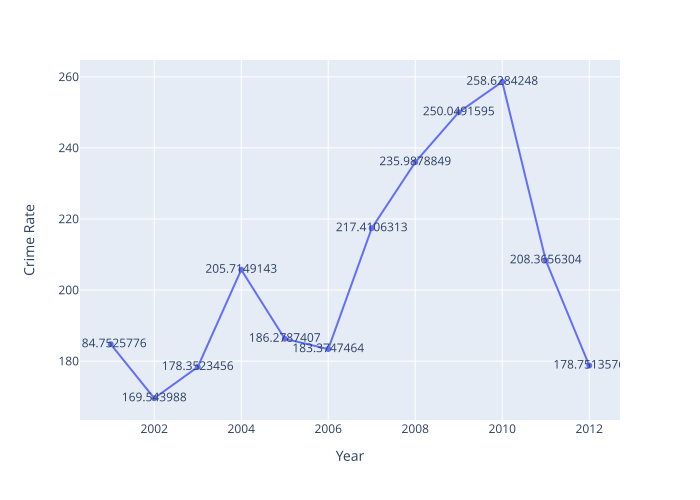

In [53]:
fig = px.line(select_andman, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')


- __As per above line plot crime rate was lowest in 2002 and highest was in 2010  for A & N Islands__

### Crime Rate Analysis of Andhra Pradesh year wise

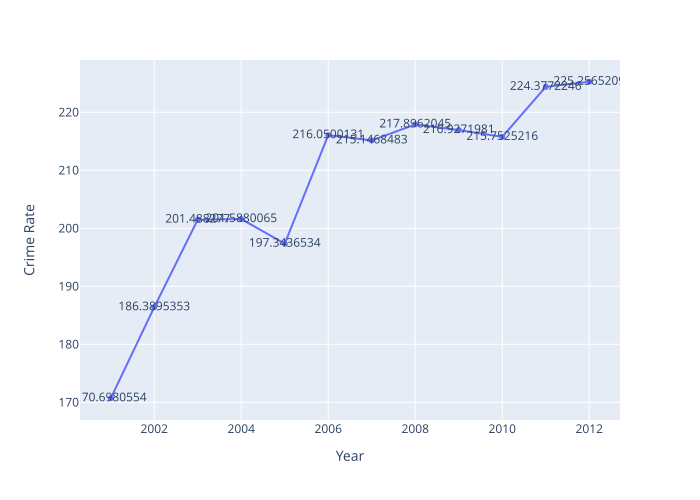

In [54]:
fig = px.line(select_andhra, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')



- __For Andhra Pradesh Crime rate was lowest in 2001 and highest was in 2012__

### Crime Rate Analysis of Arunachal Pradesh year wise

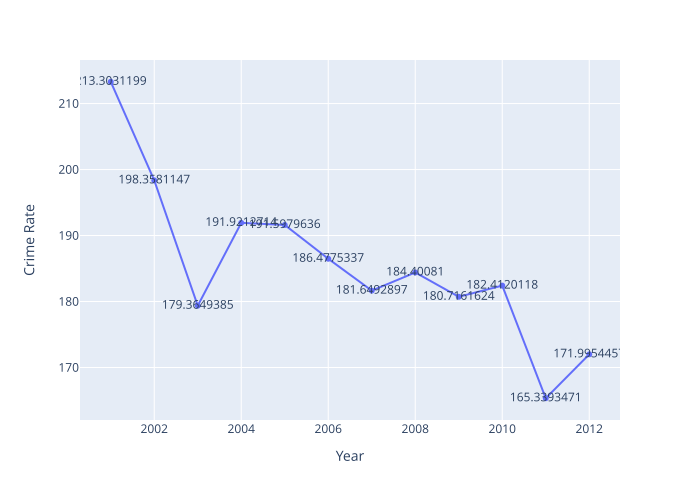

In [55]:
fig = px.line(select_arunachal, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')


__As per above Line plot Arunachal Pradesh has Lowest crime rate in 2012 and highest in 2001 which is a good thing that means Crime is decrasing in this state.__

### Crime Rate Analysis of Assam year wise

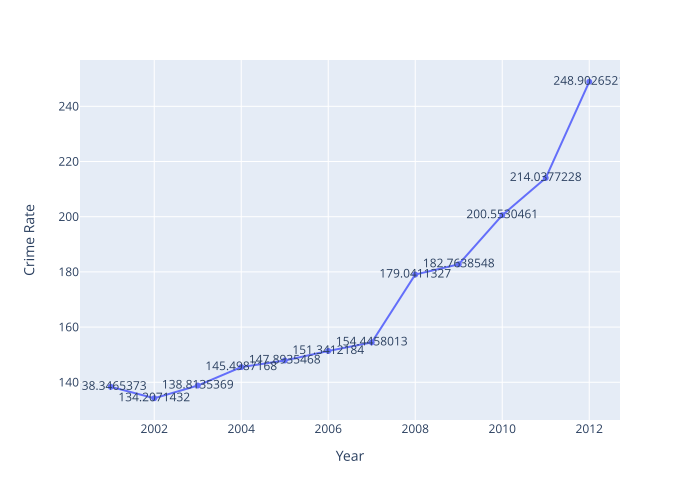

In [56]:

fig = px.line(select_assam4, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__As per above Line plot Assam has Hishest crime rate in 2012 and Lowest in 2001__

### Crime Rate Analysis of Bihar year wise

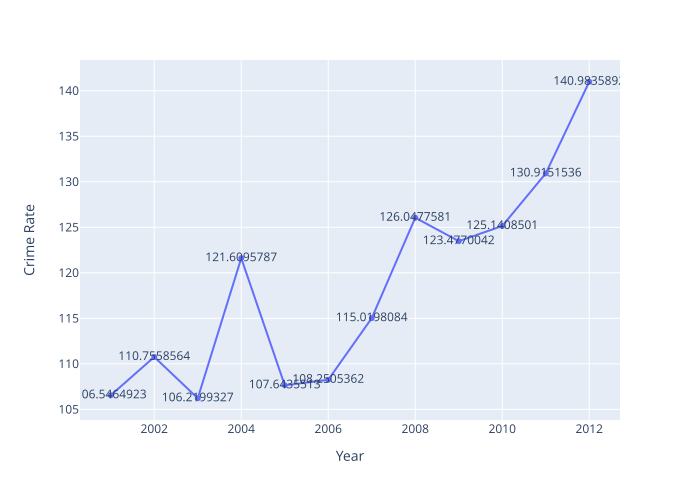

In [57]:
fig = px.line(select_bihar, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__It is clear from above plot  that Bihar has Increasing trend for Crime rate that means Crime rate is keep on increasing from 2001__ 

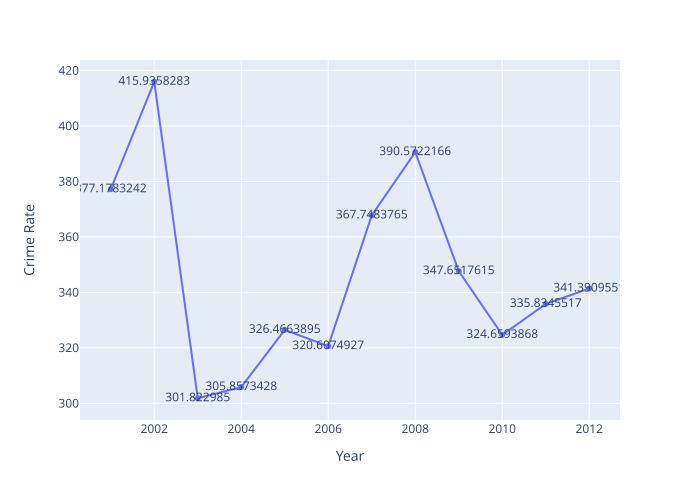

In [58]:
fig = px.line(select_chandigarh, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')


__Chandigarh Crime kept fluctauting from 2001 , Crime rate was highest in 2002 and lowest in 2003__

### Crime Rate Analysis of Chhatisgarh year wise

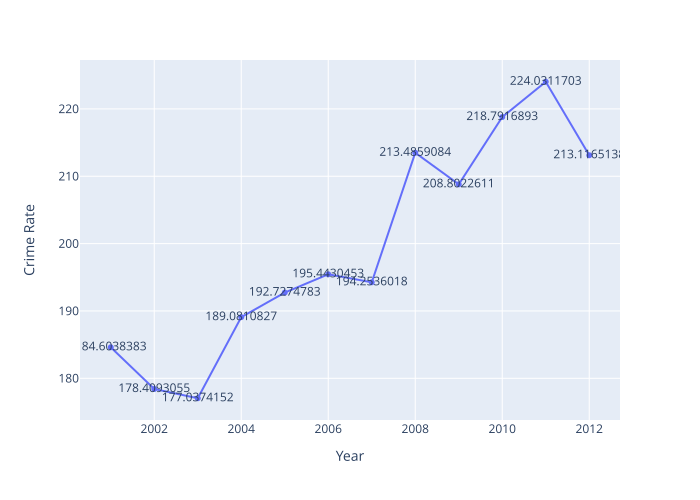

In [59]:

fig = px.line(select_chhatisgarh, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Chhtaisgarh has Lowest crime rate recorded in 2003 and highest was in 2011__

### Crime Rate Analysis ofD & N Haveli year wise

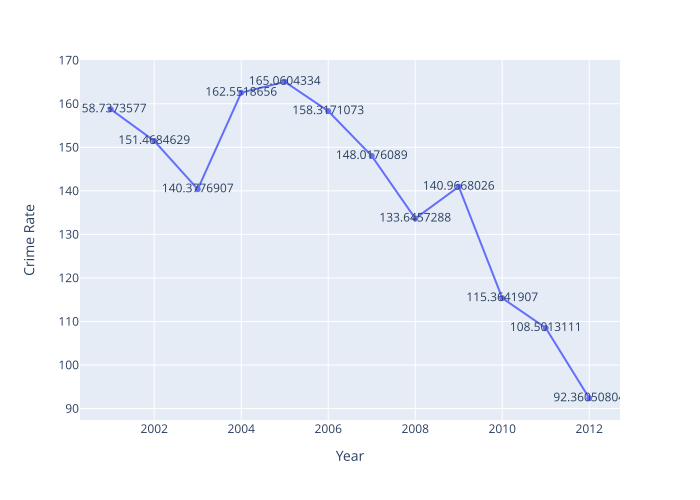

In [60]:
fig = px.line(select_haveli, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')


__Highest Crime rate was recorded in 2005 and lowest recorded in 2012__
### Crime Rate Analysis of Daman & Diu year wise

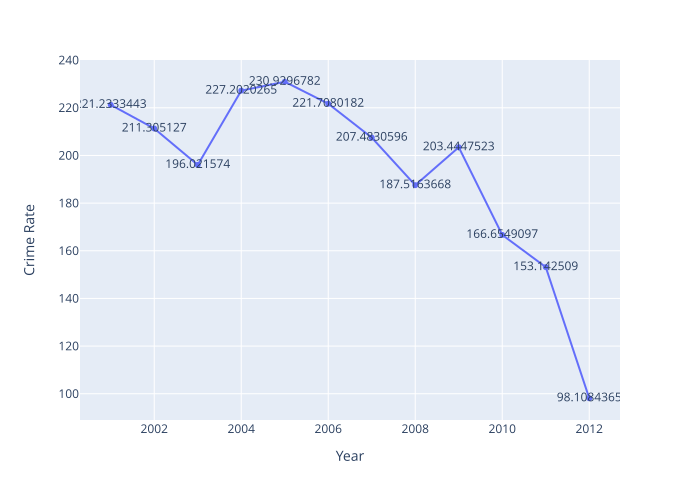

In [61]:
fig = px.line(select_daman, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')


__Daman & DIu Crime rate was highest in 2005 since then its decreasing till 2012.__

### Crime Rate Analysis of Delhi year wise

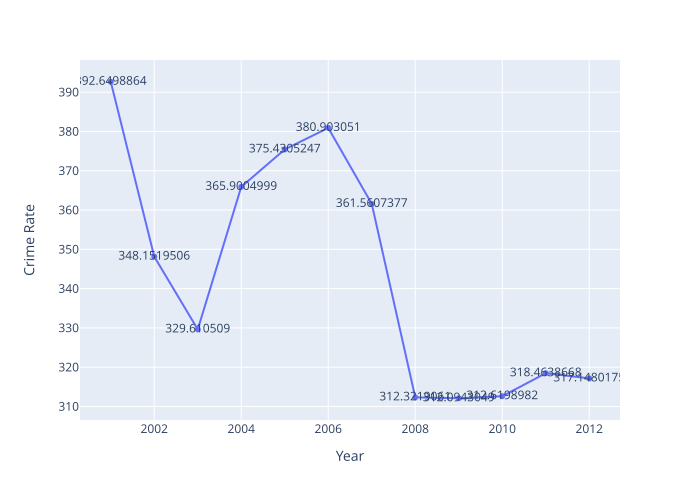

In [62]:
fig = px.line(select_delhi, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Delhi Crime rate was at peak in 2001 and its fluctuated till 2008 and it got decresed in 2010__

### Crime Rate Analysis of GOA  year wise

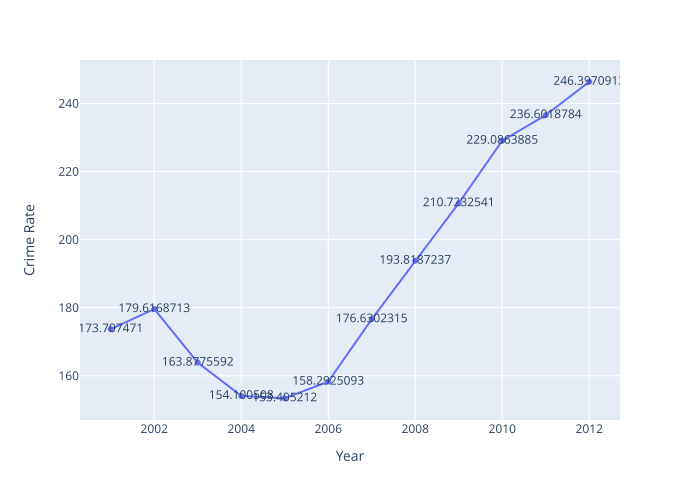

In [63]:
fig = px.line(select_goa, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Goa Crime rate was lowest in 2004 and Highest recorded in 2012__

### Crime Rate Analysis of GUJARAT year wise

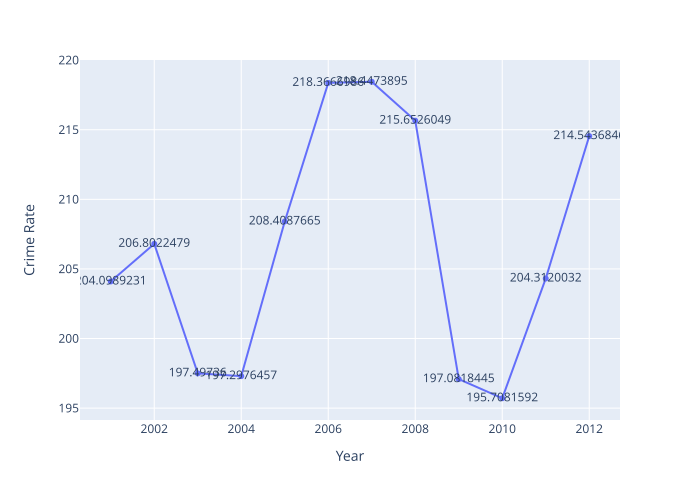

In [64]:
fig = px.line(select_gujarat, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Gujarat has highest crime rate was in 2007 and lowest crime rate was in 2010__

### Crime Rate Analysis of HARYANA year wise

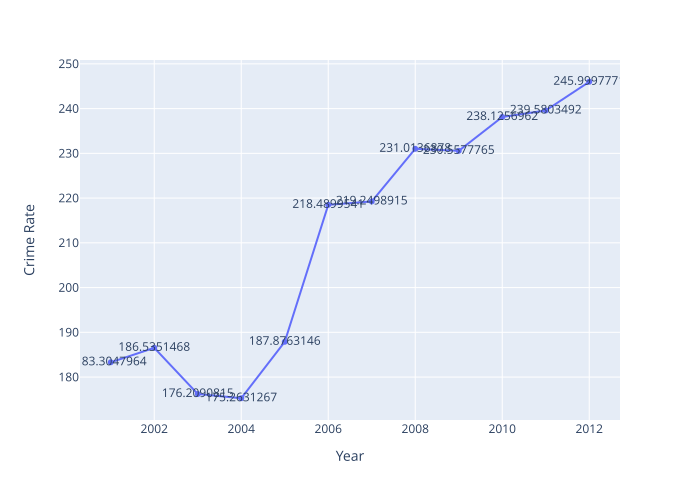

In [65]:
fig = px.line(select_haryana, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate of Haryana keep on increasing since 2004.__

### Crime Rate Analysis of HIMACHAL PRADESH year wise

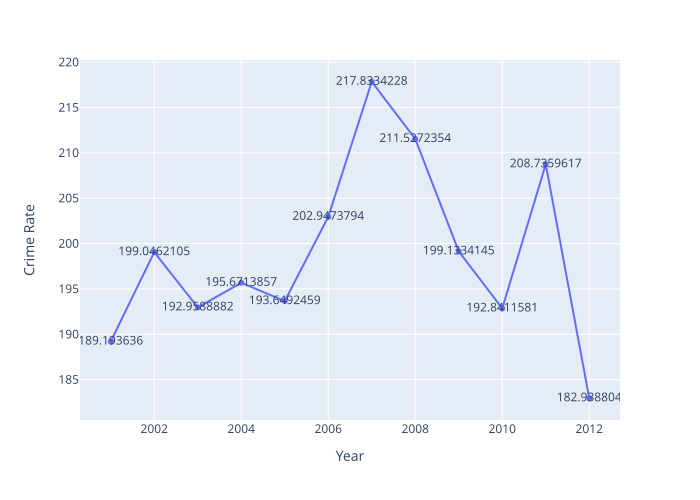

In [66]:
fig = px.line(select_himachal, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Lowest Crime rate For Himachal Pradeh was recorded in 2012 and highest was in 2007__

### Crime Rate Analysis of JAMMU & KASHMIR year wise

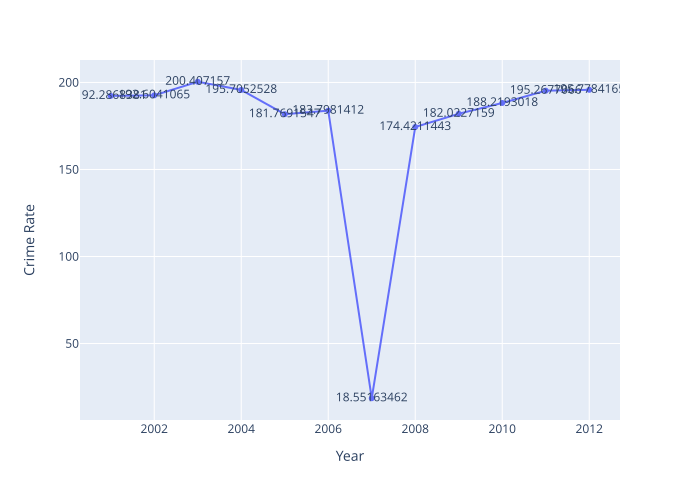

In [67]:
fig = px.line(select_jk, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__For Jammu & Kashmir 2007 was only year when there were less crime__

### Crime Rate Analysis of JHARKHAND year wise

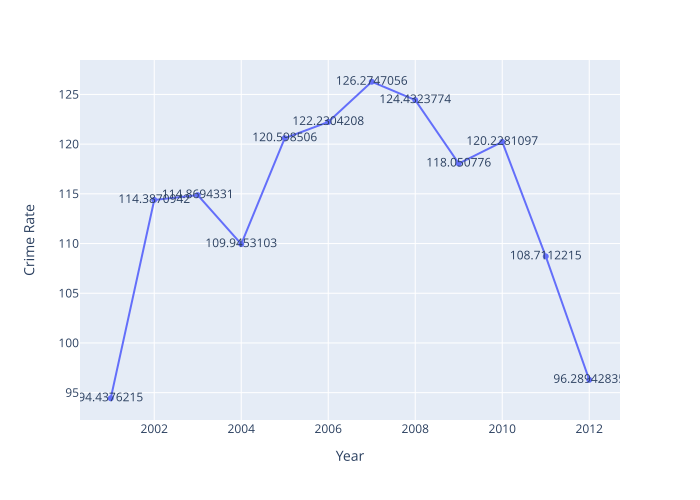

In [68]:
fig = px.line(select_jharkhand, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Lowest CRime rate was in 2001 and Highest was in 2007.__

### Crime Rate Analysis of Karnataka year wise

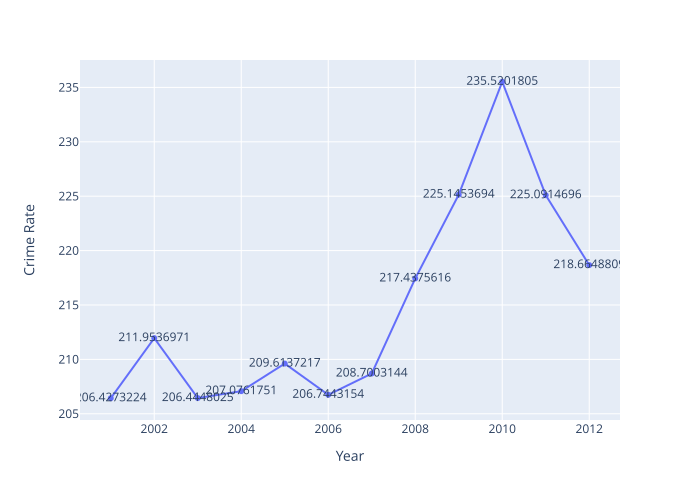

In [69]:
fig = px.line(select_karnataka, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__For Karnataka 2001 had less crime rate and year 2010 highest crime rate.__

### ### Crime Rate Analysis of Karala year wise

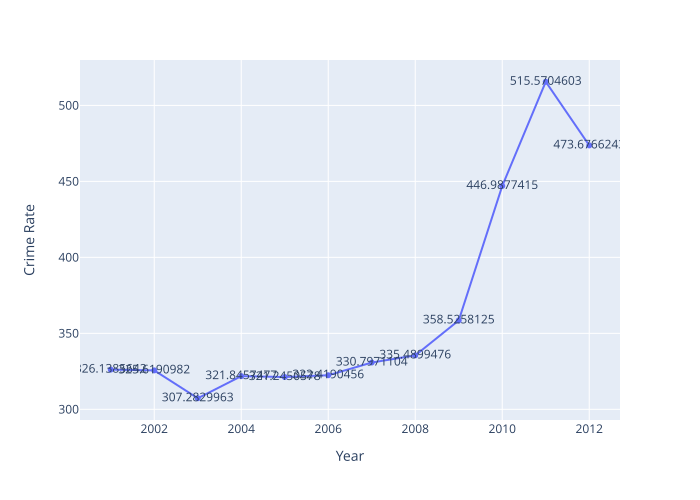

In [70]:
fig = px.line(select_kerala, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate was lower till 2009 and then it got incresed and highest recrded in 2011__

### Lakshdweep Crime rate yearly analysis

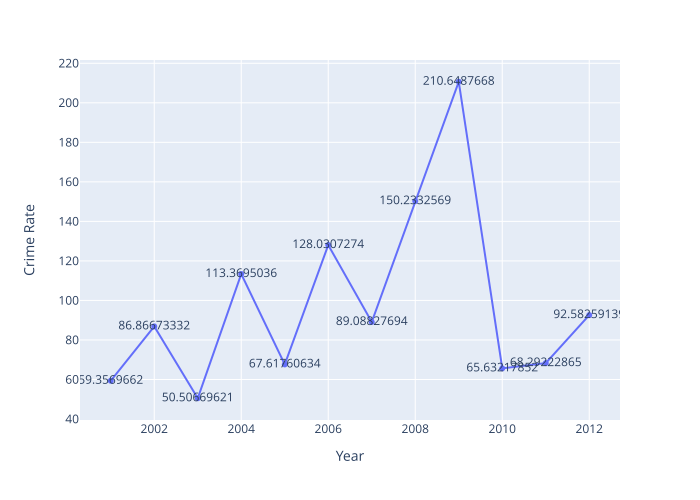

In [71]:
fig = px.line(select_lakshdweep, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Lakshdweep was less Crime prone in 2001 and was highest in 2007__

### For MadhyaPradesh Crime Rate Analysis Yearly

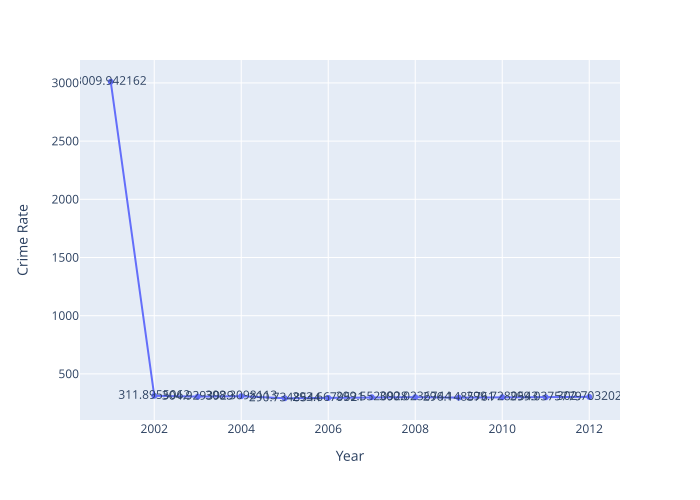

In [72]:
fig = px.line(select_mp, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__MP State has highest crime rate in 2001 andfrom 2002 it decresed.__

#### Maharashtra Crime Rate Analysis Year wise

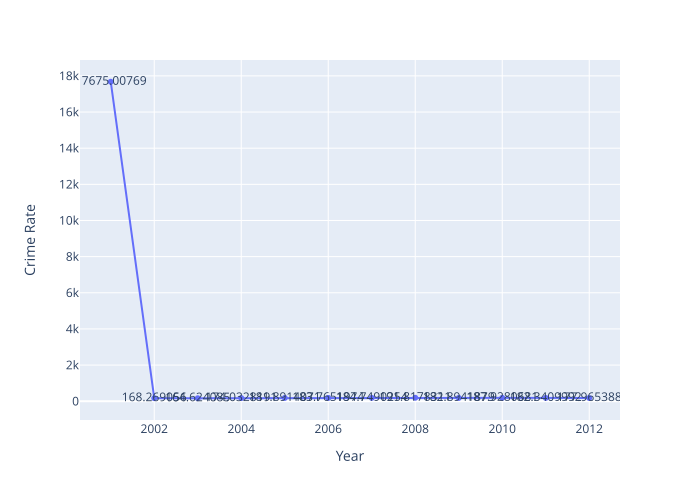

In [73]:
fig = px.line(select_maharashtra, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Maharashtra Had lowest crime rate since 2002 till 2012__

### Manipur Crime rate Analysis year wise

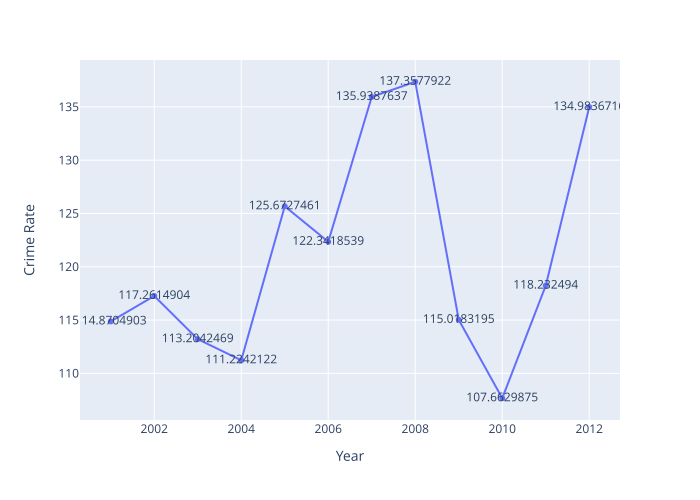

In [74]:
fig = px.line(select_manipur, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Manipur has lowest Crime rate in 2010 and highest in 2008__

### Meghylaya Crime rate Analysis Year wise

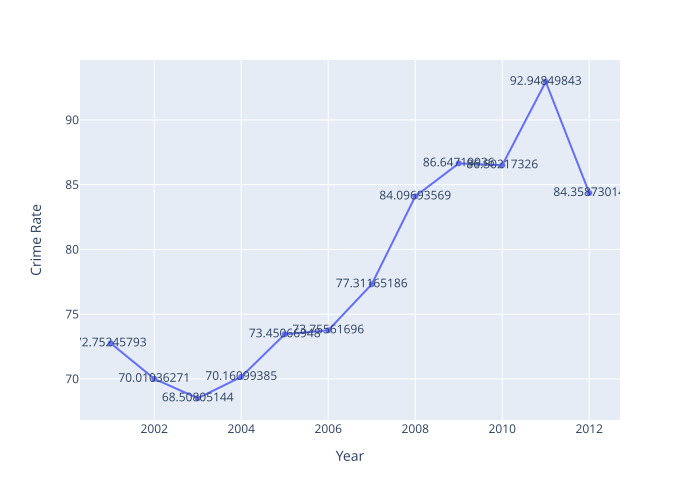

In [75]:
fig = px.line(select_meghalaya, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Meghayala state had lowest crime rate in 2003 and highest was in 2011__

### Mizoram Crime Rate Analysis Year wise

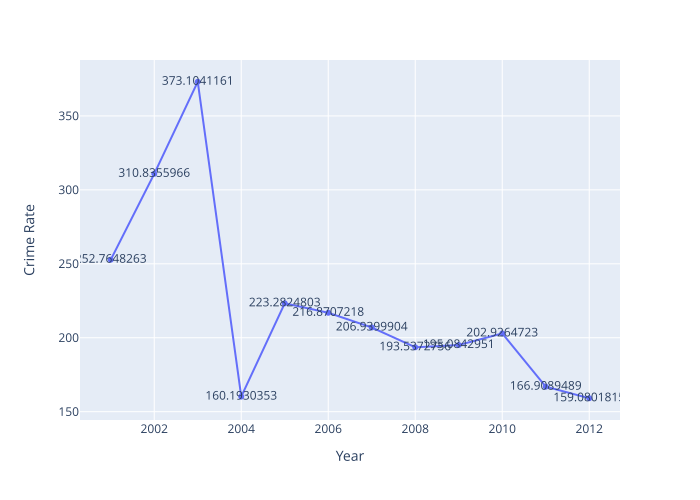

In [76]:
fig = px.line(select_mizoram, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Mizoram lowest crime rate was in 2012 and highest was in 2003__

### Nagaland Crime Rate Analysis Year wise

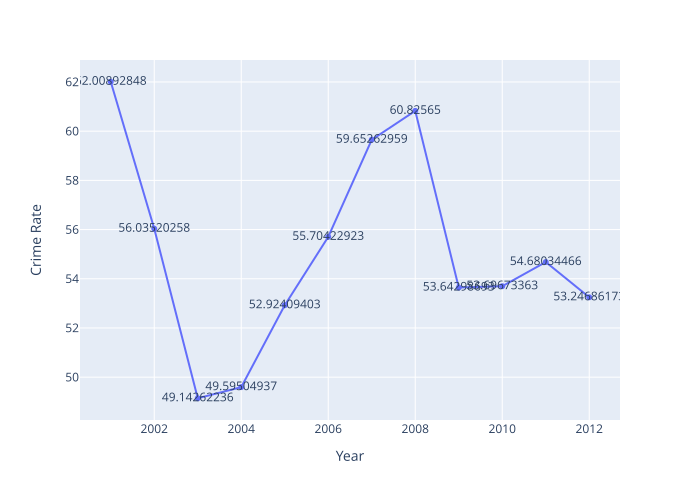

In [77]:
fig = px.line(select_nagaland, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Nagaland crime rate was lowest in 2003 and highest was in 2001__

### Odisha Crime rate Analysis year wise

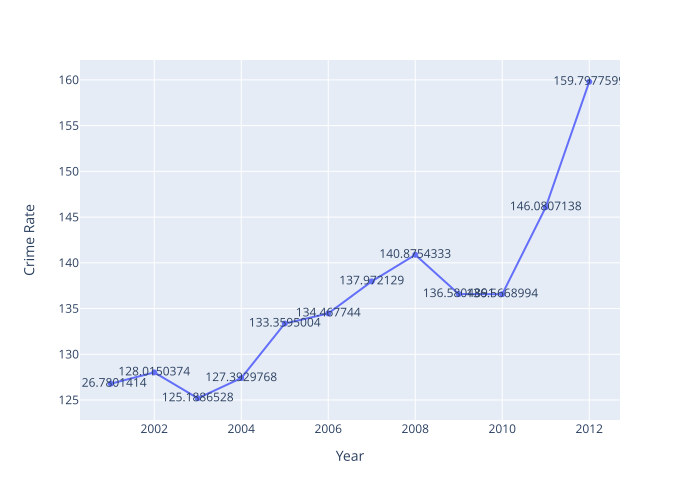

In [78]:
fig = px.line(select_odisha, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Odisha crime rate was highest in 2012 and lowest was in 2003

### PuduCherry Crime rate Analysis

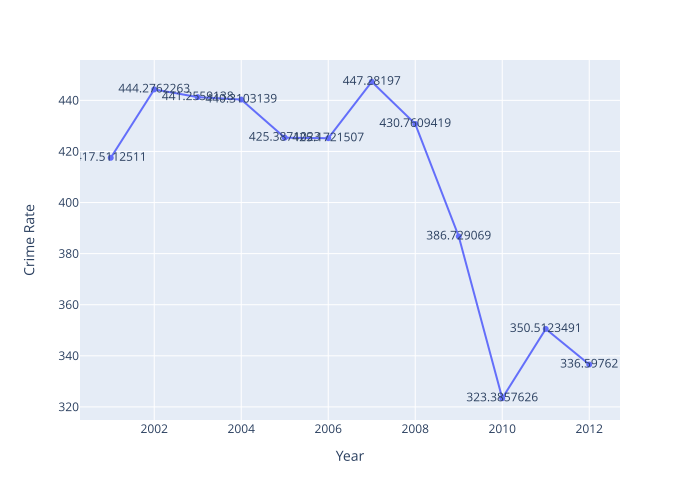

In [79]:
fig = px.line(select_puducherry, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Puducherry had lowest crime rate was in 2010 and highest was in 2007

### Punjab Crime rate Analysis Year wise

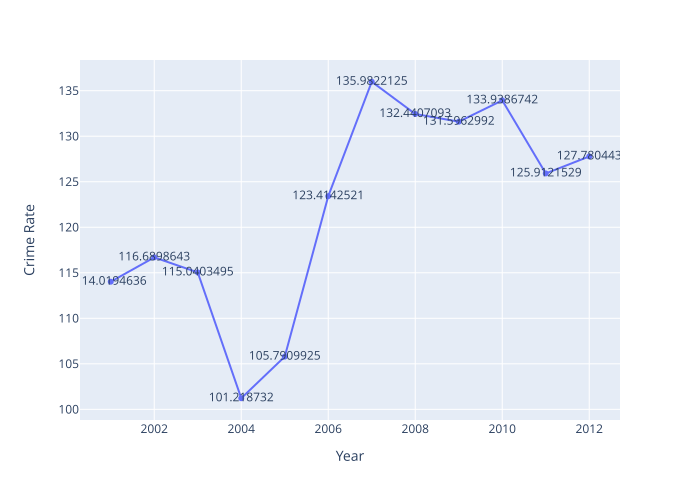

In [80]:
fig = px.line(select_punjab, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate of Punjab was lowest in 2004 and highest was in 2007

### Rajasthan Crime rate Analysis Year wise

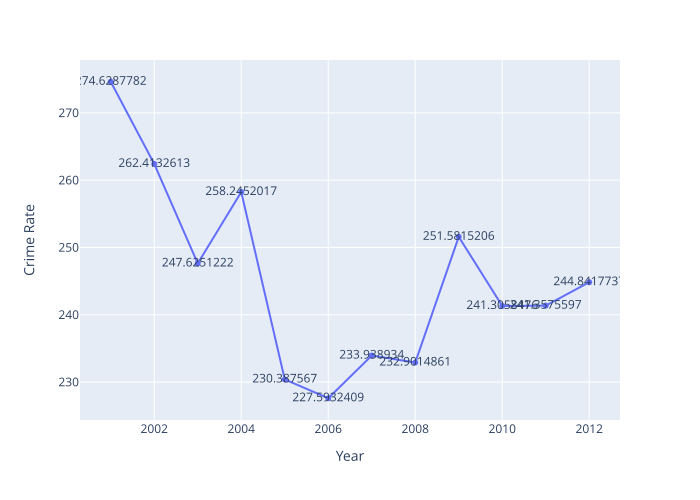

In [81]:
fig = px.line(select_rajasthan, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate of Rajasthan was in 2005 and hghest was in 2001

### Sikkim Crime Rate Analysis Year wise

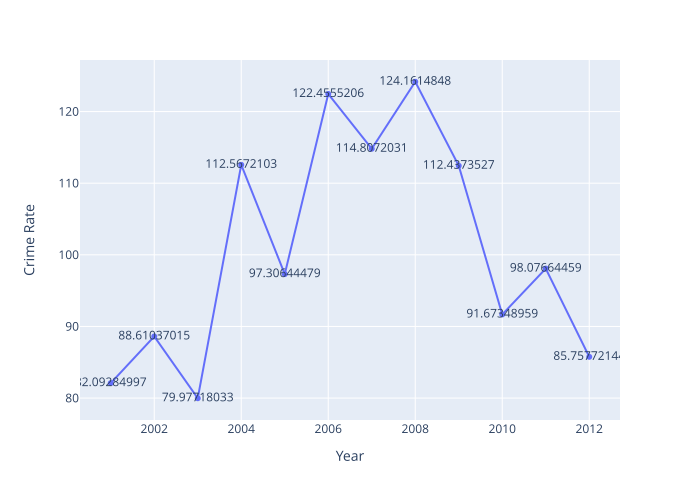

In [82]:
fig = px.line(select_sikkim, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate of Sikkim was in 2003 and highest was in 2008.

### Tamil Nadu Crime Rate Analyss year wise

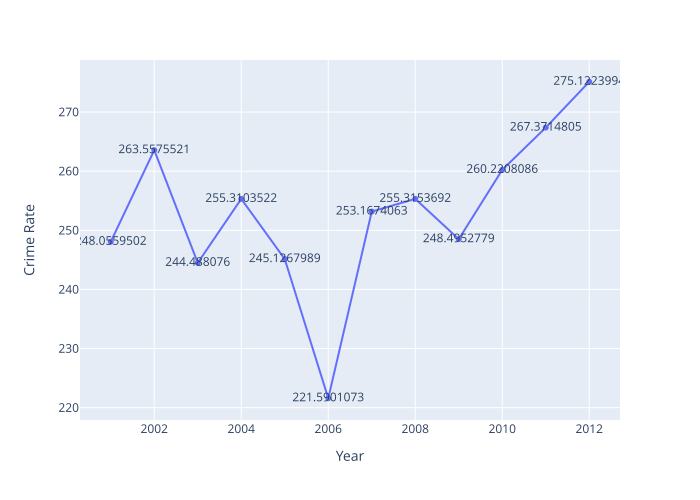

In [83]:
fig = px.line(select_tamilnadu, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Tamil Nadu crime rate was highest in 2012 and lowest was in 2006

### Tripura Crime rate analysis Yearwise

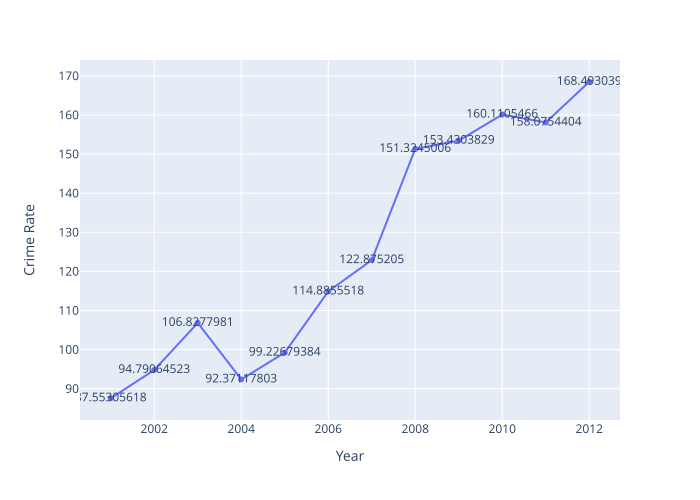

In [84]:
fig = px.line(select_tripura, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Crime rate of Tripura was in 2001 lowest and highest was in 2012__

### Uttar Pradesh Crime rate Analysis Year wise

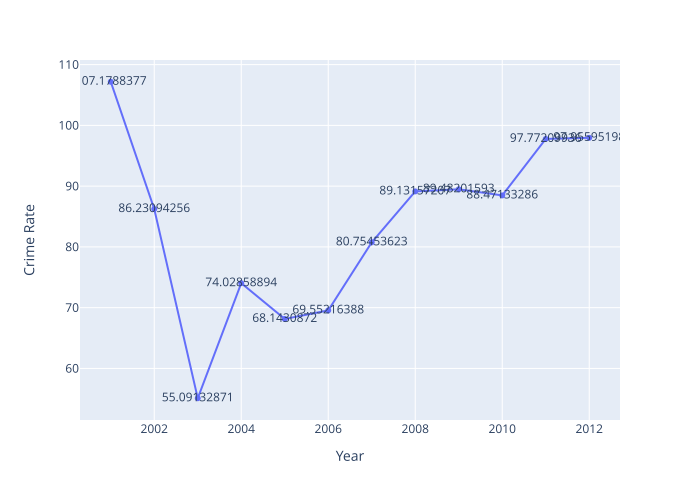

In [85]:
fig = px.line(select_up, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Uttar Pradesh had lowest crime rate was in 2003 and highest was in 2001

### Uttarakhand Crime Rate Analysis Year wise

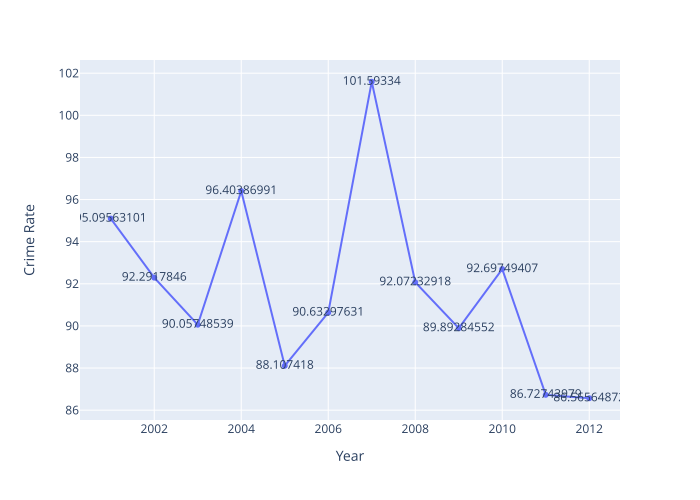

In [86]:
fig = px.line(select_uk, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

__Uttarakhand state had lowest crime rate was in 2012 and highest was in 2007

### West Bengal Crime Rtae Analysis Year wise

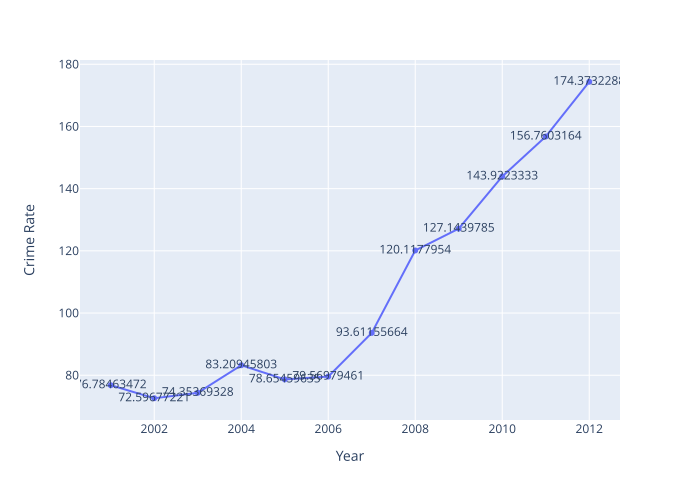

In [87]:
fig = px.line(select_wb, x='Year', y='Crime Rate', text='Crime Rate', markers=True)
fig.show(renderer='svg')

Crime rate of West Bengal keep on increasing since 2006 and 2002 was the year when crime rate was lowest

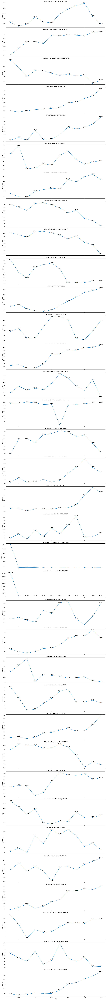

In [107]:

states_list = df['State/UT'].unique()

fig, axes = plt.subplots(len(states_list), 1, figsize=(15, 4 * len(states_list)), sharex=True)

for i, state in enumerate(states_list):

    state_df = df[df['State/UT'] == state]
    
    state_df = state_df.sort_values(by='Year')
    
    sns.lineplot(x='Year', y='Crime Rate', data=state_df, marker='o', ax=axes[i])
    
    axes[i].set_title(f'Crime Rate Over Years in {state}')
    axes[i].set_ylabel('Crime Rate')
    
    for index, row in state_df.iterrows():
        axes[i].text(row['Year'], row['Crime Rate'], f"{row['Crime Rate']:.2f}", ha='center', va='bottom')

axes[-1].set_xlabel('Year')

plt.tight_layout()
plt.show()

## 2.4 Analysis of area vs overall crime

In [88]:

df_area=df.groupby('Area (km2)').min()


In [89]:
dfarea=pd.pivot_table(df, values ='Area (km2)', index =['State/UT','Year','Total Crimes'],
                          aggfunc = max)
dfarea

Area (km2)
State/UT     Year Total Crimes            
A& N ISLANDS 2001 1386                8249
             2002 1269                8249
             2003 1352                8249
             2004 1612                8249
             2005 1462                8249
...                                    ...
WEST BENGAL  2008 232767             88752
             2009 248291             88752
             2010 284277             88752
             2011 314488             88752
             2012 353008             88752

[420 rows x 1 columns]

In [90]:
df_area=df[['State/UT','Year','Total Crimes','Area (km2)']]
df_area

,State/UT,Year,Total Crimes,Area (km2)
0,A& N ISLANDS,2001,1386,8249
1,ANDHRA PRADESH,2001,278982,275045
2,ARUNACHAL PRADESH,2001,5243,83743
3,ASSAM,2001,81418,78438
4,BIHAR,2001,189612,94163
...,...,...,...,...
415,TAMIL NADU,2012,415626,130058
416,TRIPURA,2012,13461,10486
417,UTTAR PRADESH,2012,444403,240928
418,UTTARAKHAND,2012,20122,53483


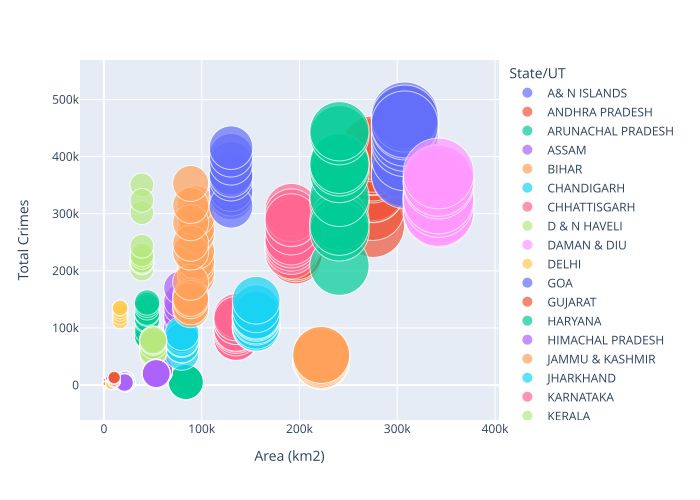

In [91]:
fig = px.scatter(df_area, x="Area (km2)", y="Total Crimes", size="Area (km2)",color='State/UT',
                  size_max=50)
fig.show('svg')

Lakshdweep Area is 72 KM2 and Total crimes are  only 127 which is showing afetr hovering over the Lakshdweep circle
The Area of Rajasthan state is 342239(Largest) Km2 and Total Crime are like 370.502K. While the Uttar Pradesh has 240928 km2 area and Total Crimes are 444.403K Total Crimes which is the Highest__



##  2.5 Analysis of Population vs overall Crime

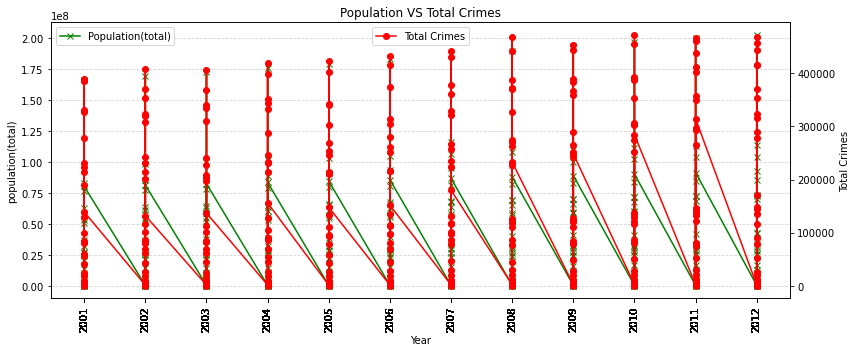

In [106]:
fig, ax = plt.subplots(figsize=(12,5))
ax2 = ax.twinx()
ax.set_title('Population VS Total Crimes')
ax.set_xlabel('Year')



ax.plot(df['Year'],df['population(total)'], color='green', marker='x')
ax2.plot(df['Year'],df['Total Crimes'], color='red', marker='o')



ax.set_ylabel('population(total)')
ax2.set_ylabel('Total Crimes')
ax.legend(['Population(total)'])
ax2.legend(['Total Crimes'], loc='upper center')
ax.set_xticks(df['Year'])
ax.set_xticklabels(df['Year'], rotation=90)
ax.yaxis.grid(color='lightgray', linestyle='dashed')

plt.savefig('18.jpg')

plt.tight_layout()
plt.show()

More the population chances of Crimes would be higher.Hence, Population is one of the important factors influencing incidence of crime. A number of socio-economic factors, besides population, could influence the crime situation at a particular place.

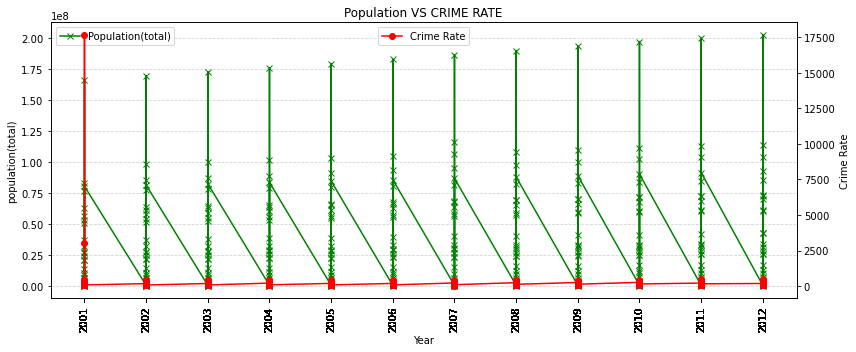

In [108]:
fig, ax = plt.subplots(figsize=(12,5))
ax2 = ax.twinx()
ax.set_title('Population VS CRIME RATE')
ax.set_xlabel('Year')


plt.savefig('19.jpg')

ax.plot(df['Year'],df['population(total)'], color='green', marker='x')
ax2.plot(df['Year'],df['Crime Rate'], color='red', marker='o')



ax.set_ylabel('population(total)')
ax2.set_ylabel('Crime Rate')
ax.legend(['Population(total)'])
ax2.legend(['Crime Rate'], loc='upper center')
ax.set_xticks(df['Year'])
ax.set_xticklabels(df['Year'], rotation=90)
ax.yaxis.grid(color='lightgray', linestyle='dashed')
plt.savefig('20.jpg')


plt.tight_layout()
plt.show()

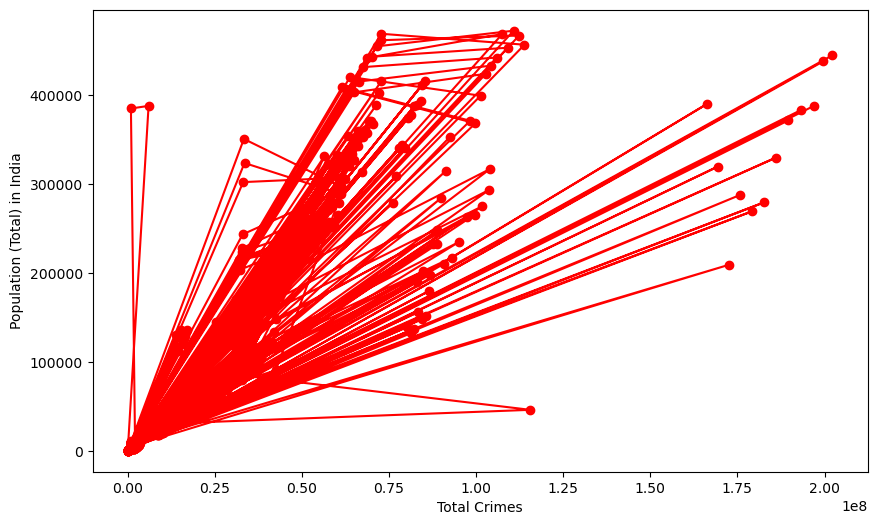

In [106]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(df['population(total)'], df['Total Crimes'], marker='o', linestyle='-', color='red')

ax.set_xlabel('Total Crimes')
ax.set_ylabel('Population (Total) in India')

plt.show()

## 2.6 Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.

In [110]:
tc= df.groupby("State/UT")["TOTAL IPC CRIMES"].sum().sort_values(ascending = False)
print("Crime by Each state:\n",tc)

Crime by Each state:
 State/UT
MADHYA PRADESH       2413770
MAHARASHTRA          2273436
TAMIL NADU           2060176
ANDHRA PRADESH       2018981
UTTAR PRADESH        1858074
RAJASTHAN            1855916
KARNATAKA            1481063
KERALA               1437459
GUJARAT              1385775
BIHAR                1346293
WEST BENGAL          1119304
ODISHA                647946
DELHI                 633174
ASSAM                 597764
HARYANA               595303
CHHATTISGARH          561027
JHARKHAND             422351
PUNJAB                384131
JAMMU & KASHMIR       259155
HIMACHAL PRADESH      154948
UTTARAKHAND           103204
PUDUCHERRY             54116
TRIPURA                52734
CHANDIGARH             40807
MANIPUR                35072
GOA                    32051
ARUNACHAL PRADESH      27652
MIZORAM                26146
MEGHALAYA              25249
NAGALAND               13133
A& N ISLANDS            9102
SIKKIM                  7000
D & N HAVELI            4651
DAMAN & DIU 

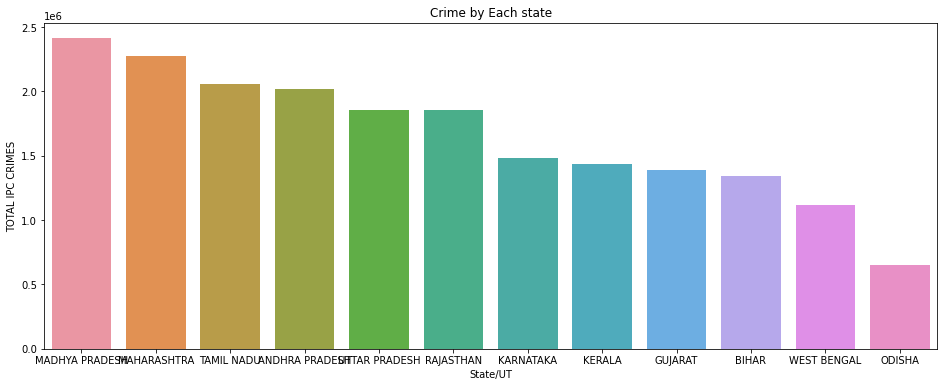

In [111]:
plt.figure(figsize=(16,6))
sns.barplot(x = tc.index[:12], y = tc[:12]).set(title = "Crime by Each state")
plt.savefig('crimebyeachstate.jpg')
plt.show()

Top 12 states which have higher IPC Crimes -

TOP 3 States are Madhya Pradesh, Maharashtra and Tamil Nadu__


In [95]:
tcr= df.groupby("State/UT")["Crime Rate"].sum().sort_values(ascending = False)
print("Crime  Rate  of Each state:\n",tcr)

Crime  Rate  of Each state:
 State/UT
MAHARASHTRA          19655.285754
MADHYA PRADESH        6316.673756
PUDUCHERRY            4869.180671
KERALA                4385.598206
CHANDIGARH            4155.725611
DELHI                 4126.855153
TAMIL NADU            3037.821579
RAJASTHAN             2946.820293
MIZORAM               2661.527940
KARNATAKA             2578.819811
HARYANA               2532.205598
ANDHRA PRADESH        2488.914059
GUJARAT               2478.217328
A& N ISLANDS          2457.210401
CHHATTISGARH          2389.783310
HIMACHAL PRADESH      2386.476742
DAMAN & DIU           2324.749802
GOA                   2276.257698
ARUNACHAL PRADESH     2227.536009
JAMMU & KASHMIR       2100.831570
ASSAM                 2035.844909
D & N HAVELI          1675.369068
ODISHA                1633.077477
TRIPURA               1509.964138
PUNJAB                1463.824145
MANIPUR               1453.769068
BIHAR                 1422.610111
JHARKHAND             1370.455004
WEST BENGA

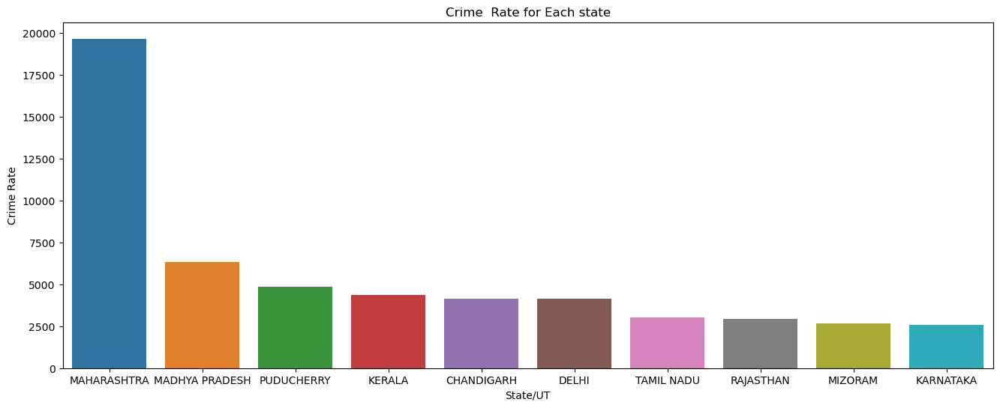

In [99]:
plt.figure(figsize=(16,6))
sns.barplot(x = tcr.index[:10], y = tcr[:10]).set(title = "Crime  Rate for Each state")
plt.savefig('crimeratestate.jpg')
plt.show()

- Maharashtra State is the one which i having the highest crime rate and Nagaland is the state which ahs lowest crime rate 

Total IPC Crimes in Each State:
 State/UT
MAHARASHTRA          19655.285754
MADHYA PRADESH        6316.673756
PUDUCHERRY            4869.180671
KERALA                4385.598206
CHANDIGARH            4155.725611
DELHI                 4126.855153
TAMIL NADU            3037.821579
RAJASTHAN             2946.820293
MIZORAM               2661.527940
KARNATAKA             2578.819811
HARYANA               2532.205598
ANDHRA PRADESH        2488.914059
GUJARAT               2478.217328
A& N ISLANDS          2457.210401
CHHATTISGARH          2389.783310
HIMACHAL PRADESH      2386.476742
DAMAN & DIU           2324.749802
GOA                   2276.257698
ARUNACHAL PRADESH     2227.536009
JAMMU & KASHMIR       2100.831570
ASSAM                 2035.844909
D & N HAVELI          1675.369068
ODISHA                1633.077477
TRIPURA               1509.964138
PUNJAB                1463.824145
MANIPUR               1453.769068
BIHAR                 1422.610111
JHARKHAND             1370.455004
WEST B

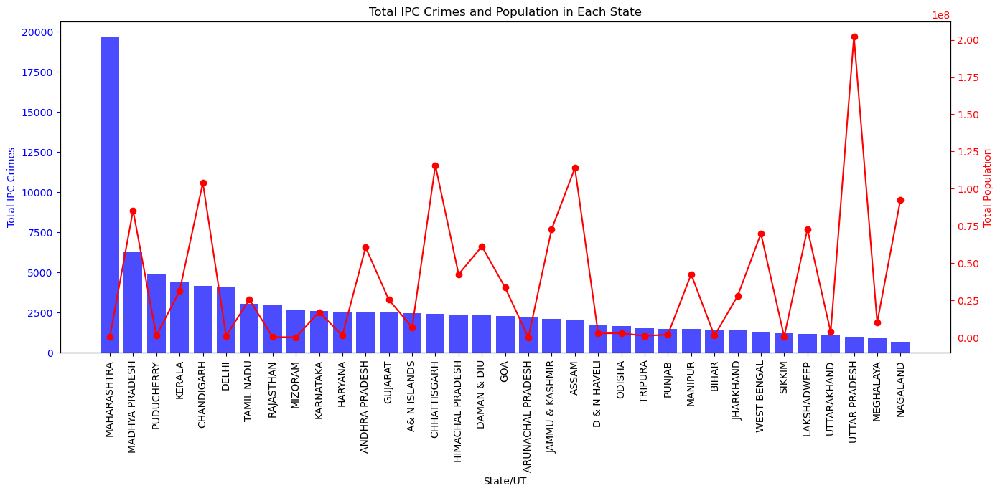

In [102]:
total_ipc_crimes = df["TOTAL IPC CRIMES"].sum()
total_population = df.groupby("State/UT")["population(total)"].max().sum()

TC_percentage = (tcr / total_ipc_crimes) * 100

population_percentage = (df.groupby("State/UT")["population(total)"].max() / total_population) * 100

print("Total IPC Crimes in Each State:\n", tcr)
print("\nTotal Population in Each State:\n", df.groupby("State/UT")["population(total)"].max())
print("\nPercentage of IPC Crimes for Each State:\n", TC_percentage)
print("\nPercentage of Population for Each State:\n", population_percentage)

fig, ax1 = plt.subplots(figsize=(16, 6))

ax1.bar(tcr.index, tcr, color='b', alpha=0.7, label='IPC Crimes')
ax1.set_xlabel('State/UT')
ax1.set_ylabel('Total IPC Crimes', color='b')
ax1.tick_params('y', colors='b')
plt.xticks(rotation='vertical')


ax2 = ax1.twinx()
ax2.plot(tcr.index, df.groupby("State/UT")["population(total)"].max(), color='r', marker='o', label='Population')
ax2.set_ylabel('Total Population', color='r')
ax2.tick_params('y', colors='r')
plt.xticks(rotation='vertical')




plt.title("Total IPC Crimes and Population in Each State")
plt.xticks(rotation='vertical')
plt.show()

A& N ISLANDS- Andaman & Nicobar Island has very low Total crimes and Total IPC crimes.Crime rate were the lowest in the year 2002 and highest in 2012.But overal the crime rate is low.

ANDHRA PRADESH- Total crimes are high and Total Ipc crimes are also high. crime rate was the lowest in 2001 and highest in 2012. Its also one of the top states in crimes like Creulty by husband and hurt/grevious hurt.

ARUNACHAL PRADESH- Total crimes and Total Ipc crimes both are low. Crime rate of ARUNACHAL PRADESH were highest in year 2001 and lowest in year 2011.

ASSAM- Crime rates of ASSAM were the lowest in 2002 and highest in yeasr 2012. The Crime rate is increasing continuously.

BIHAR- The Total Crimes and Total IPC crimes of BIHAR are moderate. The crime rate is also moderate, it was the lowest in 2001 and highest in 2012. After hitting the high crime rate in year 2004,the crime rates desreased in the yeart 2005, but after that, the crime rates are increasing continuously.Its also one of the top states in crimes like Dacoity, Riots, Dowry Deaths, Kidnapping and Murders.

CHANDIGARH- The total crimes and Total IPC crimes of CHANDIGARH is low. CHANDIGARH'S crime rate hit the highest in 2002 and lowest in year 2003.

CHHATTISGARH-With low total crimes and low Total IPC crimes, It has low crime rate which was lowest in 2003 and highest in the year 2011.

D & N HAVELI- Being a UT with an area of 491 km2, It has very low total crimes and very low total IPC crimes.

DAMAN & DIU- Its also an UT near Gujrat, crime rate of DAMAN & DIU were highest in 2005 and lowest in 2012. The crime rates are decreasing since 2009.

DELHI – The Capital of India , Delhi has low total IPC crimes, the The peak of crime rates in DELHI were in 2001 and hit the lowest in the year 2008.

GOA- Goa has low crime rate. Crime rates were the lowest in 2005 and highest in 2012. The crime rate were increasing continuously since 2005.

GUJARAT – Total IPC crimes and Total crimes are high. Crime rate was the highest in the year 2007 and lowest in the year 2010.

HARYANA – It has less Total IPC crimes and Total crimes compared to Gujrat. But it's crime rate is increasing continuously.

HIMACHAL PRADESH – Highest crime rate of HIMACHAL PRADESH was in year 2007 and lowest in 2012. The crime rate is decreasing.

JAMMU & KASHMIR – The crime rate is low of JAMMU & KASHMIR, but one of the states with highest cases of Kidnapping.

JHARKHAND – Crime rate of the state JHARKHAND was lowest in 2001 and highest in 2007, the crime rate is declining since 2007.

KARNATAKA -Karnataka has high Total IPC crime and Total crimes.

KERALA – Crime rate was the lowest in year 2003 and highest ion 2011 and are decreasing after 2011. it is the no.1 literacy state of india. Was on of the states with highest cases of other IPC crimes also one of the highest cases of Riots

LAKSHADWEEP – It has the lowest crimes. It is a small state whose crime rate was lowest in 2003 and highest in 2009. Its the State/UT with the lowest area.

MADHYA PRADESH – It has the highest total IPC crimes and total crimes. MADHYA PRADESH's crime rate was the highest in 2001 and has been low since then. Was on of the states with highest cases of other IPC crimes and one of the top states in cases like Hurt/Grevious hurt and Rapes.

MAHARASHTRA – It has the 2nd highest Total IPC crimes and total crimes. Also, it has the highest crime rate. Its the state with most cases of Rape and Theft.

MANIPUR- It is a state with very low total crimes. The crime rate of MANIPUR are sometimes high, sometimes low. Crime rate was highest in year 2008 and lowest in 2010. It is less populated.

MEGHALAYA – MEGHALAYA's total crimes are also very low with one of the lowest crime rates. me rate of MEGHALAYA was lowest in 2003 and highest in 2011 and is decreasing since then.

MIZORAM – It also has a less crime rate. MIZORAM's crime rate was the highest in 2003 and lowest in 2004.

NAGALAND – The north-eastern state with the lowest crime rate.Crime rate of NAGALAND was lowest in 2003 and highest in 2008 and after 2008, the crime rate is gradually decreasing.

ODISHA – The total IPC crimes and Total crimes are low, 647946 crimes were happened in the duration of 11 years. Crime rate of ODISHA was the lowest in 2003 and highest in 2012.

PUDUCHERRY- PUDUCHERRy also has a very low crime rate. Crime rate of PUDUCHERRY was highest in 2007 and lowest in 2010.

PUNJAB - The total crimes are low of this state. PUNJAB's crime rate was lowest in 2004 and highest in 2007.

RAJASTHAN- It has high Total IPC crimes and total crimes.Crime rate of the state RAJASTHAN was highest in 2001 and lowest in 2006. it is the largest state of India in terms of area. Also one of the states with high number of cases of cruelty by husband and cheating

SIKKIM- SIKKIM has one of the lowest Total crimes and total IPC crimes. The crime rate is also very low. Crime rate of SIKKIM was lowest in 2003 and highest in 2008.

TAMIL NADU – Tamil nadu has very high total crimes. Crime rate of TAMIL NADU was the lowest in 2006 and highest in 2012. Was on of the states with highest cases of other IPC crimes and the state with highest cases of Counterfieting.

TRIPURA – IT has one of the lowest crime rates in India.

UTTAR PRADESH- With high total IPC crimes and Total crimes, it is the most populated state of India. Crime rate is low,Crime Rate of UTTAR PRADESH was highest in 2001 and lowest in 2003, and the state with high number of cases of DOwry death, kidnapping, theft and murders

UTTARAKHAND – Very low total IPC crimes and total crimes. the crime rate is also very low which peaked in the year 2007 and hit the lowest in 2011.

WEST BENGAL- It has moderate total crimes and total IPC crimes. Crime rate of WEST BENGAL is increasing continuously since 2005. It was the lowest in 2002 and highest in 2012. Its also one of the states with highest number of rape cases reported

Crime Rate of Each State:
 State/UT
MAHARASHTRA          19655.285754
MADHYA PRADESH        6316.673756
PUDUCHERRY            4869.180671
KERALA                4385.598206
CHANDIGARH            4155.725611
DELHI                 4126.855153
TAMIL NADU            3037.821579
RAJASTHAN             2946.820293
MIZORAM               2661.527940
KARNATAKA             2578.819811
HARYANA               2532.205598
ANDHRA PRADESH        2488.914059
GUJARAT               2478.217328
A& N ISLANDS          2457.210401
CHHATTISGARH          2389.783310
HIMACHAL PRADESH      2386.476742
DAMAN & DIU           2324.749802
GOA                   2276.257698
ARUNACHAL PRADESH     2227.536009
JAMMU & KASHMIR       2100.831570
ASSAM                 2035.844909
D & N HAVELI          1675.369068
ODISHA                1633.077477
TRIPURA               1509.964138
PUNJAB                1463.824145
MANIPUR               1453.769068
BIHAR                 1422.610111
JHARKHAND             1370.455004
WEST BENGAL 

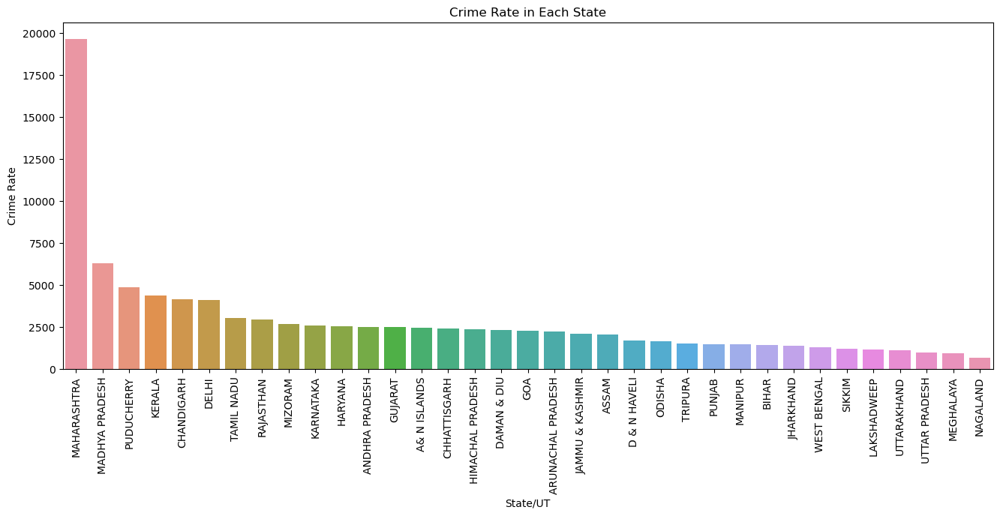

In [104]:
total_crime_rate = df["Crime Rate"].sum()

TCR_percentage = (tcr/ total_crime_rate) * 100

print("Crime Rate of Each State:\n", tcr)
print("\nPercentage of Crime Rate for Each State:\n", TCR_percentage)

plt.figure(figsize=(16, 6))
ax = sns.barplot(x=tcr.index, y=tcr)
ax.set(title="Crime Rate in Each State")
plt.xticks(rotation='vertical')

plt.show()

__Overall Observations:__

-	A& N ISLANDS- In 2001 Andaman had 184.75 Crime Rate which got declined in 2012 as population got increased and it was highest in 2009 (250.04 Crime Rate).Its Area is 8249KM2
-	ANDHRA PRADESH- Total IPC crimes were 2018981in 2012 in which that population were highest too 
-	ARUNACHAL PRADESH- with count of Total IPC Crimes 27652 – on population of 1407014 which make s crime rate of 171.
-	ASSAM- 597764 with total IPC crimes Assam state comes at 14th position 
-	BIHAR- 1346293 Total IPC crimes comes at 10th position
-	CHANDIGARH- 40807 total ipc crimes is less populated and crimes are less heer as comare to ither state /UTs
-	CHHATTISGARH-with total ipc crimes 561027 Chhatisgarh comes at 15th position
-	D & N HAVELI- Being an UT with an area of 491 km square has only 4651 total IPC crimes in the san of 11 years.
-	DAMAN & DIU- Its also an UT which has less area and crimes are 4651 , with an area of 12 km square it means leeser the area , less populated and less crimes 
-	DELHI – Being the Capital of India , Delhi has 633174 crime count in the span of 2001 to 2012. Delhi is wast in area wise 16579 km2 which is large in size. 
-	GOA- with an area of 3702 km2 , Goa is the smalles  state of India also  it has 32051 count of crime , which  has happened in the span of 11 years.(2001 to 2012)
-	 GUJARAT – is the hub for textile business , and it has crimes 1385775 and it comes at 8th position.
-	HARYANA – 595303 total ipc crimes happened in the duration of 11 year it is 44212 km2 spread and it has 245 crime rate per capita.
-	HIMACHAL PRADESH – 154948 crimes were happened in the duration of 11 years (2001-2012)
-	JAMMU & KASHMIR – 259155 crimes were reported in the duration of 11 years (2001-2012)
-	JHARKHAND – 422351 crmes were reorted in the span of 11 years (2001 to 2012)
-	KARNATAKA -1481063 crimes were happened in the duration of 11 years with the population count of 61290592 that means it has crime rate of 214 (avg)
-	KERALA – Being the no.1 state in literacy – Kearala still has 1437459 total crime count in the span of 11 yaers 
-	LAKSHADWEEP – 743 the lowest crime count for any UT also its in small in area as well only 32 km square.
-	MADHYA PRADESH – is in the Top 3 states with higher crimes  2413770, also its large in area and Population wise as well.
-	MAHARASHTRA –  State with highest crime with largest population and area covered
-	MANIPUR- Small state and less populated as well
-	 MEGHALAYA – Small state and less populated
-	MIZORAM – 1110132 count of Population and total Crimes are 35072.
-	NAGALAND – 13133 crimes were happened in the duration of 2001 to 2012
-	ODISHA – 647946 crimes were happened in the duration of 11 years.
-	PUDUCHERRY-54116 total crimes were  happened in the span of 1 years
-	 PUNJAB - 384131 crimes were happened in the duration of 11 years.
-	RAJASTHAN- In terms of area, the largest state in India is Rajasthan.It covers an area of over 342,000 square kilometers 
-	SIKKIM- 7000 crimes were reported in the span of 11 years.
-	TAMIL NADU – 3rd State with highest crimes in india 2060176 crime count.
-	TRIPURA – 52734 total Ipc counts in the  duration of 11 years.
-	UTTAR PRADESH- Most Populated state and at 5th position in total crimes against 
-	 UTTARAKHAND – 103204 total counts IPC crimes in the durationoof 11 years.
-	WEST BENGAL- 1119304 crimes were recorded in the duration of 2001 to 2012.

